# **Sauti Market Segmentation Analysis**

## **Problem Description** 

Sauti East Africa, a non-profit social enterprise, focuses on improving the livelihoods of traders and farmers, and particularly women, in East Africa. They provide them with realtime market data through access to online digital resources. Sauti collect demographic data on these traders  solutions, but never had a way to visualize the demographic data for researchers.

Sauti has requested the Miller Center team to perform limited aggregate analysis of all of our user's behavior - on a project evaluation basis. Better understanding our user's interactions will allow Sauti to better optimize their menu design and explore the feasibility of `smart menus` based on user predicted behavior.

## **Databank**
Sauti provides access to their information platforms, mainly their customer base in Kenya, Uganda, Rwanda, and Tanzania. They are connected to a cellular network and can dial a short code (e.g., *716#) to interact with numbered menus and navigate to the relevant information provided by Sauti. This information is presented in multiple languages and the platforms are refreshed on an hourly basis with the most up-to-date information.

- Market prices
- Sauti virtual marketplace
- Currency exchange rates
- Weather forecasts
- Trade and tax info
- Finance management and services
- Agriculture info and services
- Business operations info
- Legal and anti-corruption info
- COVID-19 info
- Health info
- Corruption reporting

By improving access to up-to-date and relevant information for micro, small, and medium enterprises (MSMEs), Sauti is addressing the information gaps that prevent:  

- equal access to economic opportunities for women led MSMEs.
- regulatory compliance with official trade procedures.
- transparency and accountability for officials’ corrupt, or harassing, behavior; and,
- efficient local marketing and market timing for poorer MSMEs.

## **Purpose**
Sauti strives to bridge the digital divide by ensuring that our technology-
based solutions are accessible to users, including those with limited digital literacy, smartphones, or internet access. This includes USSD and SMS solutions so that anyone, anywhere, with any kind of phone may access the same online resources normally available to smartphone apps and internet-enabled computers.

**Objectives**
1. Describe and understand the past and current behavior of our users’ key demographics (e.g. gender, age, occupation)
  - Also understand the key social determinants (and/or demographic subgroups) of user behavior

2. Develop a proof-of-concept prediction algorithm that ranks the relevance of information types to an individual user based on a user’s previous interactions and user profile (e.g., Given a user’s previous interactions and user profile, when they next access)

  Sauti’s information platforms, they have:
  - 67% chance of viewing Market Price Information
  - 22% chance of viewing Tax Calculator
  - 5% chance of viewing Weather Information
  - 3% chance of viewing Marketplace
  - <3% chance of viewing other screens

3. Based on your analysis, what recommendations would you have to Sauti to improve Sauti's users interactions with the platform? Moreover, please share your suggestions on an optimized data structure.

**Import Packages**

In [1]:
import pandas as pd # type: ignore
import matplotlib.pyplot as plt # type: ignore
import seaborn as sns # type: ignore

In [2]:
from pydrive.auth import GoogleAuth # type: ignore
from pydrive.drive import GoogleDrive # type: ignore

In [3]:
gauth = GoogleAuth()

try:
	gauth.LocalWebserverAuth()  # This will open a browser window for authentication
except Exception as e:
	print("Error during authentication:", e)
	print("Make sure you have the 'client_secrets.json' file in the same directory as this notebook.")
	print("You can download it from the Google Developer Console.")

drive = GoogleDrive(gauth)

Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?client_id=656230883833-irc9vhbrrutrbaivo3sg6t6ipui0adpt.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&access_type=offline&response_type=code

Authentication successful.


In [5]:
# List of file IDs and corresponding file names
file_info = {
    'databank': '1IL1mutGy4_f_5rdNxs5nmA2kNuCXL3oq',
    'sessions': '1YhtWEhKWVCFvhfyCyp-3NFh3NWH6a3IS',
    'replies': '1ebYHJYkUDTAseVzPPht3tHbAICqtQhzc',
    'screen_dict': '1xm4SIYDiKkbsXS-leNTRpQFelrt1oyAQ',
    'requests': '1Qv6CfZ4_wEPnbUJeD7LNKzNo3lN_8EkW'
}

# Dictionary to store DataFrames
dataframes = {}

# Iterate through the file info and download each file
for name, file_id in file_info.items():
    downloaded_file = drive.CreateFile({'id': file_id})
    file_name = f'{name}.csv'
    downloaded_file.GetContentFile(file_name)
    
    # Read the file into a DataFrame
    df = pd.read_csv(file_name, encoding='latin-1')
    dataframes[name] = df
    print(f'Loaded {file_name}')
    print(df.head())

# Access individual DataFrames
databank = dataframes['databank']
sessions = dataframes['sessions']
replies = dataframes['replies']
screen_dict = dataframes['screen_dict']
requests = dataframes['requests']

Loaded databank.csv
    cell_num_id  sess_id               key_name value_name  \
0  254000000003     50.0  procedurecommoditycat    Cereals   
1  254000000003     50.0     procedurecommodity      Maize   
2  254000000003     50.0          proceduredest   UGA->KEN   
3  254000000003     50.0        procedureorigin        EAC   
4  254000000012     52.0  procedurecommoditycat    Cereals   

                 created_date  
0  2017-06-20 00:47:17.000000  
1  2017-06-20 00:47:17.000000  
2  2017-06-20 00:47:17.000000  
3  2017-06-20 00:47:17.000000  
4  2017-06-20 00:47:33.000000  
Loaded sessions.csv
   sess_id   cell_num_id         created_date                udate data  \
0        1  254000000001  2017-06-19 22:40:35  2020-11-02 07:19:58  NaN   
1        2  254000000002  2017-06-19 23:36:12  2020-11-02 07:19:58  NaN   
2        3  254000000003  2017-06-20 00:16:05  2020-11-02 07:19:58  NaN   
3        4  254000000004  2017-06-20 00:16:06  2020-11-02 07:19:58  NaN   
4        5  25400000

In [6]:
databank.head()

,cell_num_id,sess_id,key_name,value_name,created_date
0,254000000003,50.0,procedurecommoditycat,Cereals,2017-06-20 00:47:17.000000
1,254000000003,50.0,procedurecommodity,Maize,2017-06-20 00:47:17.000000
2,254000000003,50.0,proceduredest,UGA->KEN,2017-06-20 00:47:17.000000
3,254000000003,50.0,procedureorigin,EAC,2017-06-20 00:47:17.000000
4,254000000012,52.0,procedurecommoditycat,Cereals,2017-06-20 00:47:33.000000


In [7]:
sessions.head()

,sess_id,cell_num_id,created_date,udate,data,platform_id,notes
0,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN
1,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN
2,3,254000000003,2017-06-20 00:16:05,2020-11-02 07:19:58,NaN,1,NaN
3,4,254000000004,2017-06-20 00:16:06,2020-11-02 07:19:58,NaN,1,NaN
4,5,254000000005,2017-06-20 00:16:14,2020-11-02 07:19:58,NaN,1,NaN


In [8]:
replies.head()

,reply_id,request_id,response_id,udate,sess_id
0,1,4094,1,2017-06-06 14:19:26,1
1,2,4095,22,2017-06-06 14:19:29,1
2,3,4096,1,2017-06-06 14:19:34,1
3,4,4097,48,2017-06-06 14:19:35,1
4,5,4098,44,2017-06-06 14:19:39,1


In [9]:
screen_dict.head()

,platform_id,response_id,response_theme,level,parent
0,1,1,Main Screen,0,NaN
1,1,22,Trade Info,1,1.0
2,1,48,Trade Info,1,1.0
3,1,49,Market Prices,1,1.0
4,1,98,Exchange Rates,1,1.0


In [10]:
requests.head()

,request_id,request_text,udate,sess_id
0,5122412,98,2023-09-14 14:42:35,476982
1,5122413,00,2023-09-14 14:42:47,476982
2,5122414,2,2023-09-14 14:42:49,476979
3,5122415,5,2023-09-14 14:42:59,476982
4,5122416,5,2023-09-14 14:43:12,476982


In [10]:
# from google.colab import drive
# drive.mount('/content/drive')

In [11]:
# import os
# os.chdir('/content/drive/My Drive/Colab Notebooks/My Github Repository/sauti-platform-databank')

## **Exploratory Data Analysis (EDA)**

Given the richness and complexity of our dataset, which encompasses diverse aspects such as user demographics, transactional behavior, and interaction patterns with the Sauti platform, our EDA is structured to address several key dimensions:

1. **Demographic Analysis:** Understanding the basic demographic makeup of our user base, including age, gender, education, and occupation. This helps in identifying distinct segments within the population.

2. **Behavioral Patterns:** Examining how different users interact with the Sauti platform. This includes frequency of access, types of services used, and overall engagement patterns.

3. **Transactional Insights:** Delving into the transactional data to understand the economic behavior of users, such as the types of commodities they are interested in, market preferences, and crossing frequencies.

4. **Geographical Trends:** Analyzing geographical data to discern any regional patterns or preferences, which could be crucial for targeted interventions or marketing.

## **User Based Analysis**

The primary aim of this section is to gain a clear understanding of our individual users by examining the intricacies of their platform interactions, preferences, and behaviors.

Our user-based analysis focuses on exploring the interplay between session counts and key demographic variables over several years. These variables include:

1. Borders of the participant countries
2. Age groups of the users
3. Gender distribution
4. Users' education levels
5. Frequency of border crossings
6. Users' occupations
7. Whether users are involved in producing goods
8. Most commonly used languages among users

Through this analysis, we aim to derive meaningful insights about our user base.

In [11]:
# Parse the 'created_date' column in the databank dataset
databank['created_date'] = pd.to_datetime(databank['created_date'], format="%Y-%m-%d %H:%M:%S.%f", errors='coerce')

In [12]:
# Check for any NaT values in 'created_date' and handle them
print(f"Number of NaT values in 'created_date' (databank): {databank['created_date'].isna().sum()}")

# Drop rows with NaT values in 'created_date'
databank.dropna(subset=['created_date'], inplace=True)

# Extract the year from 'created_date'
databank['year'] = databank['created_date'].dt.year

Number of NaT values in 'created_date' (databank): 14484


In [13]:
# Check the unique values in 'key_name' to ensure 'border' is present
print("Unique values in 'key_name' (databank):", databank['key_name'].unique())

# Filter rows with 'key_name' as 'border' in the databank dataset
filtered_databank = databank[databank['key_name'] == 'border']

# Check if the filtered DataFrame is empty
if filtered_databank.empty:
    print("Filtered DataFrame (databank) is empty. No rows with 'key_name' as 'border'.")
else:
    # Create a pivot table to show session count per year for different borders in databank
    pivot_databank = filtered_databank.pivot_table(index='year', columns='value_name', values='sess_id', aggfunc='count')

    # Check the pivot table for any issues
    print("Pivot table head (databank):")
    print(pivot_databank.head())

    # Use a color palette from Seaborn for better distinction
    colors = sns.color_palette("Set3", len(pivot_databank.columns))

Unique values in 'key_name' (databank): ['procedurecommoditycat' 'procedurecommodity' 'proceduredest'
 'procedureorigin' 'commoditymarket' 'commodityproduct'
 'procedurerequireddocument' 'procedurerelevantagency' 'exchangedirection'
 'language' 'border' 'gender' 'education' 'age' 'crossingfreq'
 'occupation' 'produce' 'commoditymetacountry' 'commoditymetacat']
Pivot table head (databank):
value_name  Busia  Cyanika  I do not cross the border  Katuna  Loitokitok  \
year                                                                        
2017        225.0      NaN                        NaN     3.0         NaN   
2018         93.0      NaN                        NaN     1.0         NaN   
2019         94.0      NaN                        NaN     1.0         5.0   
2020         85.0      6.0                       33.0     9.0        17.0   
2021        114.0      9.0                       23.0     4.0         6.0   

value_name  Malaba  Mutukula  Namanga  Ningine  Nyingine  Other  Rub

The plot here represents the occupation of the participating users by session counts per year from 2017 to 2023. We can clearly see that most users are <i>Traders</i> followed by users who are into <i>Farming, Fishing and Animal Husbandry</i> and <i>other</i> occupations. We also see that 2022, saw a surge in the sessions whereusers reported their occupation compared to now in 2023. Before Covid users have been mostly traders and into other occupations.

In [15]:
# %pip install dash plotly pandas seaborn

In [14]:
import dash # type: ignore
from dash import dcc, html # type: ignore
from dash.dependencies import Input, Output # type: ignore
import plotly.express as px # type: ignore
from matplotlib.colors import rgb2hex # type: ignore

# Load your dataset
databank = pd.read_csv('databank.csv', encoding='latin-1')
databank['created_date'] = pd.to_datetime(databank['created_date'], format="%Y-%m-%d %H:%M:%S.%f", errors='coerce')
databank.dropna(subset=['created_date'], inplace=True)
databank['year'] = databank['created_date'].dt.year

app = dash.Dash(__name__)

# Define the layout of the dashboard
app.layout = html.Div([
    html.H1("Sauti Platform User Based Analysis Dashboard"),

    dcc.Dropdown(
        id='variable-selection',
        options=[
            {'label': 'Border', 'value': 'border'},
            {'label': 'Age', 'value': 'age'},
            {'label': 'Gender', 'value': 'gender'},
            {'label': 'Education', 'value': 'education'},
            {'label': 'Crossing Frequency', 'value': 'crossingfreq'},
            {'label': 'Occupation', 'value': 'occupation'},
            {'label': 'Produce', 'value': 'produce'},
            {'label': 'Language', 'value': 'language'}
        ],
        value='border',
        multi=False
    ),
    
    dcc.Dropdown(
        id='category-selection',
        multi=True
    ),
    
    dcc.Graph(id='stacked-bar-chart')
])

@app.callback(
    Output('category-selection', 'options'),
    [Input('variable-selection', 'value')]
)
def set_category_options(selected_variable):
    filtered_databank = databank[databank['key_name'] == selected_variable]
    categories = filtered_databank['value_name'].dropna().unique()  # Drop null values
    return [{'label': category, 'value': category} for category in categories if category is not None]

@app.callback(
    Output('stacked-bar-chart', 'figure'),
    [Input('variable-selection', 'value'),
     Input('category-selection', 'value')]
)
def update_graph(selected_variable, selected_categories):
    filtered_databank = databank[databank['key_name'] == selected_variable]
    
    if selected_categories:
        filtered_databank = filtered_databank[filtered_databank['value_name'].isin(selected_categories)]
    
    pivot_databank = filtered_databank.pivot_table(index='year', columns='value_name', values='sess_id', aggfunc='count')

    # Convert RGB tuples to hex color strings using matplotlib.colors.rgb2hex
    colors = sns.color_palette("viridis", len(pivot_databank.columns))
    hex_colors = [rgb2hex(color) for color in colors]

    # Create the stacked bar chart
    fig = px.bar(pivot_databank.reset_index(),
                 x='year',
                 y=pivot_databank.columns,
                 title=f'User Count by {selected_variable.capitalize()} per Year',
                 labels={'value': 'User Count', 'year': 'Year', 'variable': 'Categories'},
                 barmode='stack',
                 color_discrete_sequence=hex_colors)
    
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

### **Key Observations:**

**1. Borders:**
- **Busia** is the most frequently reported border, followed by **Malaba** and **Katuna**.
- Peaks in border sessions occurred in **2020 and 2021**.
- Notable activity in **2017**, predominantly from **Busia**.

**2. Age Groups:**
- **21-30 years** is the most frequent age range, followed by **31-40 years** and **under 21 years**.
- Surge in user sessions across all age groups in **2020-2022**, likely due to increased app usage during Covid.

**3. Gender:**
- **2021** had the highest number of users, followed by **2022 and 2020**.
- **Males** generally use the app more than females, except for 2017 and 2018 where females dominated.

**4. Education Levels:**
- Majority of users have a **Secondary education level**, followed by **Primary and University/College levels**.
- Top user reporting years were **2020-2022**, linked to remote work during Covid.

**5. Crossing Frequency:**
- Most users reported **Never** crossing the border, followed by **Monthly and Daily crossings.**
- Peak in monthly crossings in **2022**, likely due to lifted Covid restrictions.

**6. Occupations:**
- Most users are **Traders**, followed by those in **Farming, Fishing, and Animal Husbandry** and other occupations.
- Surge in reported occupations in **2022**.

**7. Languages:**
- **English** is the most used language among users, followed by **Swahili.**
- Significant surges in English sessions occurred in **2021 and 2022.**

**8. Produce:**
- **2021** had the highest amount of produce sessions, followed by **2022 and 2023.**
- Increase in produce sessions during **2020-2021**, likely due to more time spent at home.

## **Sesssion Based Analysis**

The main objective of the session-based analysis is to closely examine and understand the patterns and details of user sessions on our platform. We aim to uncover how various factors affect user engagement across different timeframes.

In this analysis, we concentrate on the following key aspects:

1. Session counts associated with different procedure commodity categories in participating countries.
2. Users' interest in various commodity meta categories, as indicated by session counts.
3. Yearly session counts related to required procedural documents.
4. The distribution of male and female users in session counts, related to each procedure-relevant agency over time.

In [15]:
import dash # type: ignore
from dash import dcc, html # type: ignore
from dash.dependencies import Input, Output # type: ignore
import plotly.express as px # type: ignore
import pandas as pd # type: ignore
import seaborn as sns # type: ignore
from matplotlib.colors import rgb2hex # type: ignore

# Load your dataset
databank['created_date'] = pd.to_datetime(databank['created_date'])
databank['year'] = databank['created_date'].dt.year

app = dash.Dash(__name__)

# Define the layout of the dashboard
app.layout = html.Div([
    html.H1("Sauti Market Session-Based Analysis Dashboard"),

    dcc.Dropdown(
        id='variable-selection',
        options=[
            {'label': 'Procedure Commodity Category', 'value': 'procedurecommoditycat'},
            {'label': 'Commodity Meta Category', 'value': 'commoditymetacat'},
            {'label': 'Procedure Required Document', 'value': 'procedurerequireddocument'},
            {'label': 'Procedure Relevant Agency', 'value': 'procedurerelevantagency'}
        ],
        value='procedurecommoditycat',
        multi=False
    ),
    
    dcc.Graph(id='stacked-bar-chart')
])

@app.callback(
    Output('stacked-bar-chart', 'figure'),
    [Input('variable-selection', 'value')]
)
def update_graph(selected_variable):
    filtered_databank = databank[databank['key_name'] == selected_variable]
    
    # Define a threshold for significant categories
    threshold = 100  # Adjust this value as needed
    category_counts = filtered_databank['value_name'].value_counts()
    significant_categories = category_counts[category_counts > threshold].index

    # Filter out smaller categories
    filtered_databank = filtered_databank[filtered_databank['value_name'].isin(significant_categories)]
    
    pivot_databank = filtered_databank.pivot_table(index='year', columns='value_name', values='sess_id', aggfunc='count')

    # Convert RGB tuples to hex color strings using matplotlib.colors.rgb2hex
    colors = sns.color_palette("viridis", len(pivot_databank.columns))
    hex_colors = [rgb2hex(color) for color in colors]

    # Create the stacked bar chart
    fig = px.bar(pivot_databank.reset_index(),
                 x='year',
                 y=pivot_databank.columns,
                 title=f'Session Count by {selected_variable.capitalize()} per Year',
                 labels={'value': 'Session Count', 'year': 'Year', 'variable': 'Categories'},
                 barmode='stack',
                 color_discrete_sequence=hex_colors)
    
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

### **Key Observations:**

**1. Procedure Relevant Agency:**
- **Clearing Agent** is the most frequently used agency, followed by **Kenya Bureau of Standards (KEBS)** and **COMESA Trade Information Desk Office (TIDO)**.
- Most agencies are predominantly used by **male** users.
- Agencies like Port Health, Tanzania Revenue Authority (TRA), Uganda National Bureau of Standards (UNBS), and Uganda Revenue Authority (URA) are **rarely used** and **exclusively by males**.

**2. Procedure Commodity Category:**
- **Cereals** is the most frequent commodity category, followed by **Fruits and Clothing and Shoes**.
- A surge in trading activities for these categories occurred in **2021-2022**, likely due to the shift to online activities during Covid.

**3. Commodity Meta Category:**
- **Cereals** is the most frequent meta category, followed by **Vegetable and Tubers and Livestock and Animal Products**.
- Significant increases in these categories were observed in **2020-2021**, likely influenced by Covid.

**4. Procedure Required Document:**
- **Import Permit** is the most common document, followed by **National ID Card/Passport** and **Certificate of Origin**.
- A surge in document usage occurred in **2021-2022**, with the most documents used in 2021, possibly due to Covid.
- Documents like Certificate of Origin and Valid Invoice have been **increasingly used since 2021.**

## **Social and Demographic User Analysis**

The primary goal of the Social and Demographic User Analysis is to delve into the social and economic factors influencing user behavior and preferences on our platform. This analysis aims to elucidate the interactions of various social and demographic groups within our user base. Our objective is to uncover distinct behavioral trends and preferences among different user profiles.

This section focuses on:

1. Session counts of male and female users across different age ranges.
2. Comparative session counts of male and female users within each Procedure Commodity Category.
3. Top 10 commodity products preferred by male and female users, analyzed by session count over time.
4. The proportion of male and female users within each age range, aligned with the Response Themes over the years.

To achieve this, we first have joined the datasets—screen_dict and replies—on the response_id column to form merged_responsedata.

In [16]:
# Joining screen_dict and replies datasets
merged_responsedata_raw = pd.merge(screen_dict, replies, on='response_id', how='outer')

# Use boolean indexing to filter rows where 'column_name' is not 'main screen' as this is just the initial screen for every platform
merged_responsedata = merged_responsedata_raw[merged_responsedata_raw['response_theme'] != 'Main Screen']
merged_responsedata.head()

,platform_id,response_id,response_theme,level,parent,reply_id,request_id,udate,sess_id
0,NaN,0,NaN,NaN,NaN,64,4161,2017-06-06 22:29:54,4
1,NaN,0,NaN,NaN,NaN,65,4162,2017-06-06 22:29:59,4
2,NaN,0,NaN,NaN,NaN,66,4163,2017-06-06 22:30:00,4
3,NaN,0,NaN,NaN,NaN,67,4164,2017-06-06 22:30:09,4
4,NaN,0,NaN,NaN,NaN,68,4165,2017-06-06 22:30:13,4


In [17]:
# Extracting the 'year' and filtering the data
merged_responsedata['udate'] = pd.to_datetime(merged_responsedata['udate'])
merged_responsedata['year'] = merged_responsedata['udate'].dt.year

# Group the data by 'year' and 'value_name' and count the sessions
grouped_responsedata = merged_responsedata.groupby(['year', 'response_theme'])['sess_id'].count().unstack()

# Sort the columns by the sum of each column (total count of sessions) in descending order
grouped_responsedata = grouped_responsedata[grouped_responsedata.sum().sort_values(ascending=False).index]

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\1227326879.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\1227326879.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [18]:
import dash # type: ignore
from dash import dcc, html # type: ignore
from dash.dependencies import Input, Output # type: ignore
import plotly.graph_objects as go # type: ignore
import pandas as pd # type: ignore

# Load your dataset
databank['created_date'] = pd.to_datetime(databank['created_date'])
databank['year'] = databank['created_date'].dt.year

# Define the layout of the dashboard
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("Social Determinant and User Behavior Analysis Dashboard"),

    dcc.Dropdown(
        id='analysis-selection',
        options=[
            {'label': 'Response Themes by Year', 'value': 'response_theme'},
            {'label': 'Gender and Age Distribution', 'value': 'gender_age'},
            {'label': 'Gender and Procedure Commodity Category', 'value': 'gender_procedure_commodity'},
            {'label': 'Top 10 Commodity Products by Gender', 'value': 'top_commodities'},
            {'label': 'Gender and Age Range by Response Theme', 'value': 'age_range_response'}
        ],
        value='response_theme',
        multi=False,
        style={'backgroundColor': 'white', 'color': 'black'}
    ),
    
    html.Div(id='filter-options', children=[
        dcc.Checklist(
            id='gender-selection',
            options=[
                {'label': 'Male', 'value': 'Male'},
                {'label': 'Female', 'value': 'Female'}
            ],
            value=['Male', 'Female'],
            labelStyle={'display': 'inline-block', 'backgroundColor': 'white', 'color': 'black'}
        ),
        
        dcc.Dropdown(
            id='age-selection',
            options=[
                {'label': '<21', 'value': '<21'},
                {'label': '21-30', 'value': '21-30'},
                {'label': '31-40', 'value': '31-40'},
                {'label': '41-50', 'value': '41-50'},
                {'label': '51-60', 'value': '51-60'},
                {'label': '61-70', 'value': '61-70'}
            ],
            value=['<21', '21-30', '31-40', '41-50', '51-60', '61-70'],
            multi=True,
            style={'backgroundColor': 'white', 'color': 'black'}
        )
    ], style={'display': 'none'}),
    
    dcc.Graph(id='analysis-graph')
])

@app.callback(
    Output('filter-options', 'style'),
    [Input('analysis-selection', 'value')]
)
def toggle_filter_options(selected_analysis):
    if selected_analysis == 'age_range_response':
        return {'display': 'block'}
    else:
        return {'display': 'none'}

@app.callback(
    Output('analysis-graph', 'figure'),
    [Input('analysis-selection', 'value'),
     Input('gender-selection', 'value'),
     Input('age-selection', 'value')]
)
def update_graph(selected_analysis, selected_genders, selected_ages):
    if selected_analysis == 'response_theme':
        # Code for Response Themes by Year
        merged_responsedata['udate'] = pd.to_datetime(merged_responsedata['udate'])
        merged_responsedata['year'] = merged_responsedata['udate'].dt.year
        grouped_responsedata = merged_responsedata.groupby(['year', 'response_theme'])['sess_id'].count().unstack()
        grouped_responsedata = grouped_responsedata[grouped_responsedata.sum().sort_values(ascending=False).index[:10]]  # Select top 10 response themes
        fig = px.bar(grouped_responsedata, x=grouped_responsedata.index, y=grouped_responsedata.columns, 
                     title='Sessions by Response Theme per Year', labels={'value': 'Total Sessions', 'index': 'Year'},
                     barmode='stack')
        
    elif selected_analysis == 'gender_age':
        # Code for Gender and Age Distribution
        age_df = databank[databank['key_name'] == 'age']
        gender_df = databank[databank['key_name'] == 'gender']
        merged_df = age_df.merge(gender_df, on='sess_id')
        grouped = merged_df.groupby('value_name_x')['value_name_y'].value_counts().unstack().fillna(0)
        fig = px.bar(grouped, x=grouped.index, y=grouped.columns, 
                     title='Total Session Count by Gender and Age', labels={'value': 'Total Session Count', 'index': 'Age'},
                     barmode='stack')
        
    elif selected_analysis == 'gender_procedure_commodity':
        # Code for Gender and Procedure Commodity Category
        procedurecommoditycat_df = databank[databank['key_name'] == 'procedurecommoditycat']
        gender_df = databank[databank['key_name'] == 'gender']
        merged_df = procedurecommoditycat_df.merge(gender_df, on='sess_id')
        grouped = merged_df.groupby('value_name_x')['value_name_y'].value_counts().unstack().fillna(0)
        fig = px.bar(grouped, x=grouped.index, y=grouped.columns, 
                     title='Total Session Count by Gender and Procedure Commodity Category', labels={'value': 'Total Session Count', 'index': 'Procedure Commodity Category'},
                     barmode='stack')
        
    elif selected_analysis == 'top_commodities':
        # Code for Top 10 Commodity Products by Gender
        commodityproduct_df = databank[databank['key_name'] == 'commodityproduct']
        gender_df = databank[databank['key_name'] == 'gender']
        merged_df = commodityproduct_df.merge(gender_df, on='sess_id')
        grouped = merged_df.groupby('value_name_x')['value_name_y'].value_counts().unstack().fillna(0)
        top_male = grouped['Male'].nlargest(10)
        top_female = grouped['Female'].nlargest(10)
        fig = make_subplots(rows=1, cols=2, subplot_titles=('Male', 'Female'), specs=[[{'type': 'domain'}, {'type': 'domain'}]]) # type: ignore

        # Add male pie chart
        fig.add_trace(go.Pie(labels=top_male.index, values=top_male.values, name='Male'), 1, 1)

        # Add female pie chart
        fig.add_trace(go.Pie(labels=top_female.index, values=top_female.values, name='Female'), 1, 2)

        # Update layout
        fig.update_layout(title_text='Top 10 Commodity Products by Gender')

    elif selected_analysis == 'age_range_response':
        # Code for Gender and Age Range Distribution by Response Theme
        df = databank[databank['key_name'].isin(['gender', 'age'])]
        df = df.pivot_table(index='sess_id', columns='key_name', values='value_name', aggfunc='first')
        df = pd.merge(merged_responsedata, df, on='sess_id', how='outer')
        df = df.dropna(subset=['age', 'gender', 'response_theme'], how='any')
        df = df[['age', 'gender', 'response_theme']]
        df = df.drop_duplicates(subset=['age', 'gender', 'response_theme'])
        
        # Filter data based on selected genders and ages
        df = df[df['gender'].isin(selected_genders) & df['age'].isin(selected_ages)]
        
        # Create the parallel categories diagram
        fig = go.Figure(go.Parcats(
            dimensions=[
                {'label': 'Response Theme', 'values': df['response_theme']},
                {'label': 'Gender', 'values': df['gender']},
                {'label': 'Age', 'values': df['age']}
            ],
            line={'color': 'blue'},
            hoveron='color',  # Only show tooltips for the boxes
            labelfont={'size': 12, 'family': 'Arial'},
            tickfont={'size': 10, 'family': 'Arial'},
            hoverinfo='count+probability',  # Show count and probability in the tooltip
            hovertemplate='%{label}<br>Count: %{count}<br>Probability: %{probability:.2f}<extra></extra>'
        ))

        fig.update_layout(title_text='Gender and Age Range Distribution by Response Theme')

    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\2555985177.py:79: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\2555985177.py:80: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\2555985177.py:79: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

### **Key Observations:**

**1. Social Determinant Analysis - Response Theme by Section Over Time:**
- **Market Prices** is the most frequently searched response theme from 2017 to 2023, followed by **Weather, Marketplace, and Exchange Rates**.
- Significant surges in session counts were observed in **2021, 2022, and 2023**, indicating increased interest in these themes.

**2. Session Counts by Age Range:**
- The **21-30 years age range** has the highest session counts, predominantly by males, followed by the **31-40 years** and **41-50 years age ranges**.
- **Men** generally have higher session counts across all age ranges, indicating more male users are involved in occupations outside the home.

**3. Session Counts by Procedure Commodity Category:**
- More **women** show interest in **Pulses and Tubers**
- Only **men** are interested in **Timber**.

**4. Top 10 Commodity Products by Gender:**
- **Women** are significantly more interested in **Rosecoco Beans**.
- Only **men** show interest in **Goat and Soya Beans**.
- Only **women** show interest in **Black Beans and Can Fertilizer**.

**5. Gender and Age Range by Response Theme:**
- **Kenya Business Operations Info** is only associated with **male users aged 31-40 years**.
- **Older women (61-70 years)** are not particularly interested in **Crop/Poultry Farming and Risk Management/Insurance**.
- **More females and younger women** show interest in **Crop Nutrition and Legal and Anticorruption Info**.

# **Probablility Distribution Random Classifier Model**

**Predict Commodity Meta Categories for Males and Females** <br>

**Step 1.** Split date into year and months columns , show how useage and demographics have changed over time <br>

**Step 2.** Split databank into users database and sessions database, use this for demographic info<br>

**Step 3.** Merge sessions based questions with requests, replies and user database to get info on how usage has changed over time, can run regressions on this to predict useage <br>
<br>
*use country code to get country for platforms users with that country code use

In [19]:
# Filter relevant rows and pivot the data
databank = databank[databank['key_name'].isin(['gender', 'age', 'commoditymetacat'])]

# Remove duplicate entries based on 'sess_id'
databank = databank.drop_duplicates(subset=['sess_id', 'key_name'], keep='first')

In [20]:
# databank = databank.pivot_table(index='sess_id', columns='key_name', values='value_name', aggfunc='first')
databank = databank.pivot(index='sess_id', columns='key_name', values='value_name')
databank.reset_index(inplace=True)

# Drop `sess_id` from databank and remove NaN missing values
databank = databank.drop('sess_id', axis=1)
databank = databank[pd.notna(databank['gender'])]
databank = databank[pd.notna(databank['age'])]
databank = databank[pd.notna(databank['commoditymetacat'])]

# Get dummy variables for the binary variables `gender` and `age`
databank = pd.get_dummies(databank, columns=['gender', 'age'], prefix=['gender', 'age'])

In [23]:
# %pip install scikit-learn

In [21]:
from sklearn.model_selection import train_test_split  # type: ignore # Import train_test_split
from sklearn.ensemble import RandomForestClassifier # type: ignore

# Drop target variable `commoditymetacat` from X
X = databank.drop('commoditymetacat', axis=1)
y = databank['commoditymetacat']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
# Train a Random Forest classifier (you can choose other classifiers)
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

RandomForestClassifier()

In [23]:
# Predict Probability Distribution
# Input age range and gender for prediction
input_data = X_train.columns.to_list()  # Use the same columns that were used for training
print('Training columns:' + str(input_data))

input_data = pd.DataFrame({
   'gender_Female': [1],
   'gender_Male': [0],
   'age_21-30': [1],
   'age_31-40': [0],
   'age_41-50': [0],
   'age_51-60': [0],
   'age_61-70': [0],
   'age_<21':   [0],
})

# Predict probability distribution of commoditymetacat
probs = model.predict_proba(input_data)

# Get the class labels (commoditymetacat names)
class_labels = model.classes_

# Print the names and probabilities
for label, prob in zip(class_labels, probs[0]):
   print(f"Commodity: {label}, Probability: {prob:.2f}")


Training columns:['gender_Female', 'gender_Male', 'age_21-30', 'age_31-40', 'age_41-50', 'age_51-60', 'age_61-70', 'age_<21']
Commodity: Cereals, Probability: 0.41
Commodity: Farm Inputs, Probability: 0.02
Commodity: Fruits & Nuts, Probability: 0.16
Commodity: Livestock & Animal Products, Probability: 0.20
Commodity: Other, Probability: 0.00
Commodity: Other Food Products, Probability: 0.02
Commodity: Vegetables & Tubers, Probability: 0.20


Using Random Forest Classifier, here we have predicted the various Commodity Meta Categories for Males and Females, based on their age range. It gives different values based on the selected input. We have choosen a broader category of Commodity category so as to have better prediction scores, as there were too many commodity products which would not give a good prediction value.

## **Data Cleaning**

In this Data Cleaning section, we focus on streamlining and optimizing our dataset for effective analysis. This is crucial for ensuring the accuracy and relevance of our insights, especially regarding user behavior and demographics.

The main steps in this section are:
1. **Session-Based Segmentation:** Organizing data around sess_id to track and analyze customer interactions per session.

2. **Link Demographic to Sessions:** Associating cell_num_id with demographic details to build comprehensive profiles for each transaction or customer session.




In [24]:
databank = pd.read_csv('platform_databank.csv')

In [25]:
databank.head(10)

,cell_num_id,sess_id,key_name,value_name,created_date
0,254000000003,50.0,procedurecommoditycat,Cereals,2017-06-20 00:47:17.000000
1,254000000003,50.0,procedurecommodity,Maize,2017-06-20 00:47:17.000000
2,254000000003,50.0,proceduredest,UGA->KEN,2017-06-20 00:47:17.000000
3,254000000003,50.0,procedureorigin,EAC,2017-06-20 00:47:17.000000
4,254000000012,52.0,procedurecommoditycat,Cereals,2017-06-20 00:47:33.000000
5,254000000012,52.0,procedurecommodity,Maize,2017-06-20 00:47:33.000000
6,254000000010,54.0,procedurecommoditycat,Cereals,2017-06-20 00:47:44.000000
7,254000000010,54.0,procedurecommodity,Maize,2017-06-20 00:47:44.000000
8,254000000007,59.0,procedurecommoditycat,Cereals,2017-06-20 00:48:16.000000
9,254000000007,59.0,procedurecommodity,Maize,2017-06-20 00:48:16.000000


In [26]:
databank['Country_code']=databank['cell_num_id'].astype(str).str[:3]
databank['Country_code'].astype('int')

0          254
1          254
2          254
3          254
4          254
          ... 
1150582    250
1150583    250
1150584    250
1150585    250
1150586    250
Name: Country_code, Length: 1150587, dtype: int32

In [27]:
# Convert all key names to lowercase to standardize
databank['key_name'] = databank['key_name'].str.lower()

In [28]:
databank.head()

,cell_num_id,sess_id,key_name,value_name,created_date,Country_code
0,254000000003,50.0,procedurecommoditycat,Cereals,2017-06-20 00:47:17.000000,254
1,254000000003,50.0,procedurecommodity,Maize,2017-06-20 00:47:17.000000,254
2,254000000003,50.0,proceduredest,UGA->KEN,2017-06-20 00:47:17.000000,254
3,254000000003,50.0,procedureorigin,EAC,2017-06-20 00:47:17.000000,254
4,254000000012,52.0,procedurecommoditycat,Cereals,2017-06-20 00:47:33.000000,254


## **Customer Segmentation: Demographic Clustering Using `K-Means` and `LightGBM`**

Preprocess the data with an LLM, run the embeddings through K-means, and then using Light GBM model to explain each cluster


**Import Packages**

In [32]:
# %pip install yellowbrick

In [33]:
# %pip install lightgbm

In [29]:
# data visualization
import matplotlib.cm as cm # type: ignore
import plotly.express as px # type: ignore
import plotly.graph_objects as go # type: ignore
import seaborn as sns # type: ignore

# sklearn
from sklearn.cluster import KMeans # type: ignore
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder # type: ignore
from sklearn.pipeline import Pipeline # type: ignore
from sklearn.manifold import TSNE # type: ignore
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report # type: ignore
from yellowbrick.cluster import KElbowVisualizer # type: ignore
import lightgbm as lgb # type: ignore

In [30]:
from sklearn.preprocessing import StandardScaler # type: ignore
from sklearn.decomposition import PCA # type: ignore
from sklearn.model_selection import train_test_split # type: ignore
from sklearn.pipeline import make_pipeline # type: ignore

**Preprocessing Data**

1. **Split Key/Value Pairs:** Pivot tables suggests that the data may need to be organized in a tabular format. The process involves splitting key-value pairs.

2. **Convert Text to Embedded:** Reference to the process of representing text data as numerical vectors.





In [31]:
clustering_keys = ['age','Country_code','border','occupation','gender','education','crossingfreq','produce','commodityproduct','commoditymarket','language','proceduredest']

In [32]:
clustering_df = databank.pivot_table(index=['sess_id', 'cell_num_id'], columns='key_name', values='value_name', aggfunc='first')

In [33]:
clustering_df = clustering_df.reset_index()

In [34]:
clustering_df

key_name,sess_id,cell_num_id,age,border,commoditymarket,commoditymetacat,commoditymetacountry,commodityproduct,crossingfreq,education,...,gender,language,occupation,procedurecommodity,procedurecommoditycat,proceduredest,procedureorigin,procedurerelevantagency,procedurerequireddocument,produce
0,50.0,254000000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
1,52.0,254000000012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
2,54.0,254000000010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
3,59.0,254000000007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
4,61.0,254000000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369373,466917.0,254000069990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369374,466919.0,254000118582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Swahili,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369375,466920.0,254000117507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369376,466921.0,254000119192,NaN,NaN,Kapkwen,NaN,NaN,Rosecoco Beans,NaN,NaN,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
clustering_df['Country_code']=clustering_df['cell_num_id'].astype(str).str[:3]
clustering_df['Country_code'].astype('int')

0         254
1         254
2         254
3         254
4         254
         ... 
369373    254
369374    254
369375    254
369376    254
369377    254
Name: Country_code, Length: 369378, dtype: int32

In [36]:
clustering_df=clustering_df[clustering_keys]

In [37]:
clustering_df.head()

key_name,age,Country_code,border,occupation,gender,education,crossingfreq,produce,commodityproduct,commoditymarket,language,proceduredest
0,NaN,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UGA->KEN
1,NaN,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UGA->KEN
4,NaN,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### **Embedding K-Means in Clustering Algorithm**

In this section, we will demonstrate how to utilize sentence embeddings in conjunction with the K-Means clustering algorithm. Sentence embeddings convert text data into numerical vectors, which can then be used by clustering algorithms to group similar texts together.

In [43]:
# %pip install transformers

In [44]:
# %pip install sentence-transformers

In [38]:
from sentence_transformers import SentenceTransformer # type: ignore
def make_text(x):

    text =  f"""age: {x['age']},
                border: {x['border']},
                occupation: {x['occupation']},
                gender: {x['gender']},
                education: {x['education']},
                crossingfreq: {x['crossingfreq']},
                produce: {x['produce']},
                commodityproduct: {x['commodityproduct']},
                commoditymarket: {x['commoditymarket']},
                language: {x['language']},
                proceduredest: {x['proceduredest']},
                Country_code: {x['Country_code']}
            """

    return text

text = clustering_df.apply(lambda x: make_text(x), axis=1).tolist()

c:\Users\jsjch\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [ ]:
from sentence_transformers import SentenceTransformer # type: ignore
from sentence_transformers import SentenceTransformer # type: ignore
import pandas as pd # type: ignore
from sklearn.cluster import KMeans # type: ignore

# Load a smaller and faster model
model = SentenceTransformer("sentence-transformers/paraphrase-MiniLM-L3-v2")

# Use the actual input text from the previous cells
texts = text  # Replace with your actual input texts

# Function to get embeddings with different batch sizes
def get_embeddings_with_timing(texts, batch_size):
    import time
    start_time = time.time()
    output = model.encode(sentences=texts,
                          show_progress_bar=True,
                          normalize_embeddings=True,
                          batch_size=batch_size)
    end_time = time.time()
    print(f"Batch size: {batch_size}, Time taken: {end_time - start_time} seconds", flush=True)
    return output

# Experiment with different batch sizes
# batch_sizes = [8, 16, 32, 64]
# for batch_size in batch_sizes:
    # print(f"Processing with batch size: {batch_size}", flush=True)
    # embeddings = get_embeddings_with_timing(texts, batch_size)

# Choose the optimal batch size based on the timing results
optimal_batch_size = 64  # Replace with the batch size that gave the best performance

# Get the embeddings with the optimal batch size
output = model.encode(sentences=texts,
                      show_progress_bar=True,
                      normalize_embeddings=True,
                      batch_size=optimal_batch_size)

# Convert embeddings to a DataFrame
df_embedding = pd.DataFrame(output)
df_embedding

Batches: 100%|██████████| 5772/5772 [21:06<00:00,  4.56it/s]


,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,0.028230,-0.070370,-0.027785,-0.035380,-0.079302,0.063287,0.023815,-0.084767,0.005654,-0.023734,...,0.013696,-0.053786,0.012210,-0.005230,-0.130507,-0.044707,-0.087408,0.071010,-0.032752,-0.023040
1,0.027090,-0.067752,-0.033182,-0.039746,-0.074534,0.055568,0.018893,-0.085031,0.007187,-0.019261,...,0.017296,-0.059473,0.011354,-0.008363,-0.135686,-0.043193,-0.090881,0.076354,-0.027042,-0.024702
2,0.027090,-0.067752,-0.033182,-0.039746,-0.074534,0.055568,0.018893,-0.085031,0.007187,-0.019261,...,0.017296,-0.059473,0.011354,-0.008363,-0.135686,-0.043193,-0.090881,0.076354,-0.027042,-0.024702
3,0.028230,-0.070370,-0.027785,-0.035380,-0.079302,0.063287,0.023815,-0.084767,0.005654,-0.023734,...,0.013696,-0.053786,0.012210,-0.005230,-0.130507,-0.044707,-0.087408,0.071010,-0.032752,-0.023040
4,0.027090,-0.067752,-0.033182,-0.039746,-0.074534,0.055568,0.018893,-0.085031,0.007187,-0.019261,...,0.017296,-0.059473,0.011354,-0.008363,-0.135686,-0.043193,-0.090881,0.076354,-0.027042,-0.024702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369373,0.028811,-0.064070,-0.033248,-0.037889,-0.077883,0.058943,0.018375,-0.087074,0.001538,-0.019008,...,0.018944,-0.056378,0.011733,-0.001305,-0.135576,-0.040107,-0.089694,0.079571,-0.020148,-0.028942
369374,0.027983,-0.065912,-0.037566,-0.039126,-0.074863,0.057477,0.016217,-0.086493,-0.001589,-0.018715,...,0.008978,-0.058106,0.012348,-0.009436,-0.136753,-0.043177,-0.079159,0.076726,-0.031451,-0.026628
369375,0.028811,-0.064070,-0.033248,-0.037889,-0.077883,0.058943,0.018375,-0.087074,0.001538,-0.019008,...,0.018944,-0.056378,0.011733,-0.001305,-0.135576,-0.040107,-0.089694,0.079571,-0.020148,-0.028942
369376,0.021864,-0.055152,-0.044478,-0.045377,-0.086580,0.059456,0.038101,-0.093821,-0.011347,-0.027492,...,-0.004165,-0.033886,-0.002414,0.008264,-0.126800,-0.041932,-0.082692,0.059373,-0.003821,-0.039470


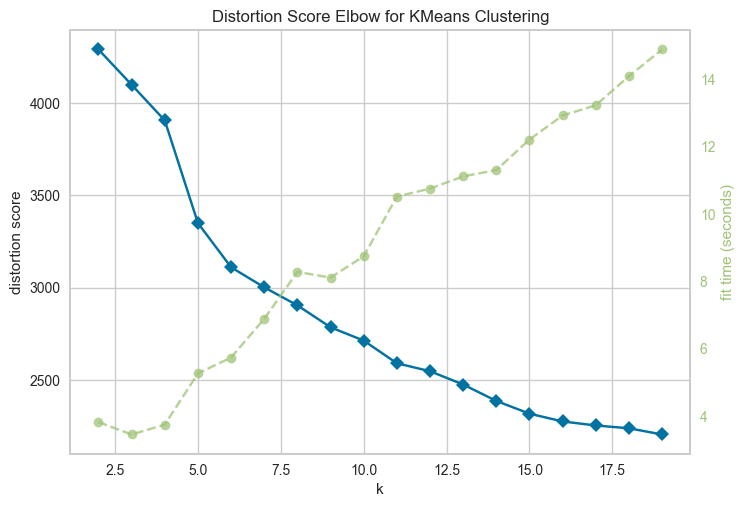

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [40]:
# Ensure there are enough samples for clustering
if len(df_embedding) < 3:
    raise ValueError("The number of samples should be at least 3 for clustering.")

# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2, min(20, len(df_embedding))), locate_elbow=False)

# Fit the data to the visualizer
visualizer.fit(df_embedding)
visualizer.show()

In [41]:
# Define the number of clusters based on the elbow method
n_clusters=8

In [42]:
# Define KMeans clustering model
km = KMeans(n_clusters=n_clusters,init = "k-means++", random_state=0)
clusters=km.fit(df_embedding)
print(km.cluster_centers_.shape)
print(km.labels_.shape)
print(km.predict(df_embedding).shape)

(8, 384)
(369378,)
(369378,)


In [43]:
# Assess the "compactness" or "internal cohesion" of the clusters.
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding)

2903.907470703125


In [44]:
km.cluster_centers_

array([[ 0.02706735, -0.05723926, -0.03664786, ...,  0.07931712,
        -0.02082514, -0.02872141],
       [ 0.02878629, -0.06405006, -0.03245268, ...,  0.07912607,
        -0.02097525, -0.02955339],
       [ 0.03037385, -0.05361409, -0.01950545, ...,  0.07198512,
        -0.01164218, -0.03794579],
       ...,
       [ 0.02865442, -0.06415371, -0.03682381, ...,  0.07744795,
        -0.03265629, -0.02703552],
       [ 0.02612901, -0.05408575, -0.02246045, ...,  0.07451583,
        -0.02343462, -0.03200409],
       [ 0.02662014, -0.05953096, -0.02992592, ...,  0.04654896,
        -0.04197525, -0.03386338]], dtype=float32)

In [48]:
from sklearn.metrics import silhouette_score # type: ignore
import numpy as np # type: ignore # type ignore

# Sample a subset of the data for faster silhouette score calculation
sample_size = 100000  # Adjust the sample size as needed
if len(df_embedding) > sample_size:
    sample_indices = np.random.choice(len(df_embedding), sample_size, replace=False) # type: ignore
    df_embedding_sample = df_embedding.iloc[sample_indices]
    clusters_predict_sample = clusters_predict[sample_indices]
else:
    df_embedding_sample = df_embedding
    clusters_predict_sample = clusters_predict

# Calculate the silhouette score
silhouette_avg = silhouette_score(df_embedding_sample, clusters_predict_sample)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.47561773657798767


In [49]:
print("Cluster memberships:\n{}".format(km.labels_))

Cluster memberships:
[1 1 1 ... 1 3 1]


### **Explain Text Clusters using LightGBM**

In this section, we will demonstrate how to utilize the Light Gradient Boosting Machine (LightGBM) to explain the clusters obtained from the K-Means algorithm. LightGBM is a powerful gradient boosting framework that provides efficient and scalable implementations for learning from large datasets.

In [50]:
from sklearn.preprocessing import LabelEncoder # type: ignore
import lightgbm as lgb # type: ignore

lgb_km = lgb.LGBMClassifier()

for col in ['age','Country_code', 'border', 'occupation', 'gender', 'education', 'crossingfreq', 'produce', 'commodityproduct', 'commoditymarket', 'language', 'proceduredest']:
    clustering_df[col] = clustering_df[col].astype('category')

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\431885235.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\431885235.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\431885235.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [51]:
import logging

# Train the LightGBM model with config parameters to suppress warnings
lgb_km = lgb.LGBMClassifier()
lgb_km.set_params(verbosity=-1)  # Set verbosity to -1 to suppress warnings and info messages
lgb_km.fit(X=clustering_df, y=clusters_predict)

# Make predictions
y_pred = lgb_km.predict(clustering_df)

In [52]:
y_pred = lgb_km.predict(clustering_df)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

Training-set accuracy score: 0.9988
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     57236
           1       1.00      1.00      1.00    169588
           2       0.99      0.99      0.99      5794
           3       1.00      0.99      0.99     30154
           4       1.00      1.00      1.00     15273
           5       1.00      1.00      1.00     84166
           6       1.00      1.00      1.00      3715
           7       1.00      1.00      1.00      3452

    accuracy                           1.00    369378
   macro avg       1.00      1.00      1.00    369378
weighted avg       1.00      1.00      1.00    369378



The accuracy score on the training model indicates that it correctly classified approximately 99.88% of the training data. While a high training accuracy is desirable, it's important to also evaluate the model on a separate test dataset to assess its generalization performance.

- The `precision`, `recall`, and `f1-score` suggests that our model  performs exceptionally well for each class on the training data. It correctly identifies instances of each class with high precision and recall, resulting in high F1-scores.
- The `support` column shows the number of instances for each class in the dataset. It provides information about the class distribution. For example, class 0 has 57,924 instances, class 1 has 52,031 instances, and so on.
- Both macro and weighted averages of `precision`, `recall`, and `F1-score` are reported as 1.00. This suggests that the **model's performance is consistent across all classes, and the weighted average takes into account class imbalances**.

While high training performance is promising, further evaluation on a separate test dataset is necessary to determine how well the model generalizes to new, unseen data.

To better understand the performed clustering algorithm (KMeans) to cluster the Sauti demographic data, we visualize clusters using the PCA, t-SNE, and the UMAP model for dimensionality reduction and visualize the clusters.

### **Principal Components Analysis (PCA)**

PCA reduces the dimensionality of your data while preserving the most significant variance, making it easier to visualize and analyze complex datasets. 

In [53]:
from sklearn.decomposition import PCA  # type: ignore
import matplotlib.pyplot as plt # type: ignore

# Create clustering_df using pivot_table
clustering_df = databank.pivot_table(index=['sess_id', 'cell_num_id'], columns='key_name', values='value_name', aggfunc='first')

# Handle missing values (if any)
clustering_df = clustering_df.fillna('missing')

# Convert categorical features to 'category' data type
for col in clustering_df.columns:
    clustering_df[col] = clustering_df[col].astype('category')

# Convert categorical features to numerical codes
clustering_df_encoded = clustering_df.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

Let's start by creating a cumulative variance plot to decide how many features we would like to keep based on the variance plot.

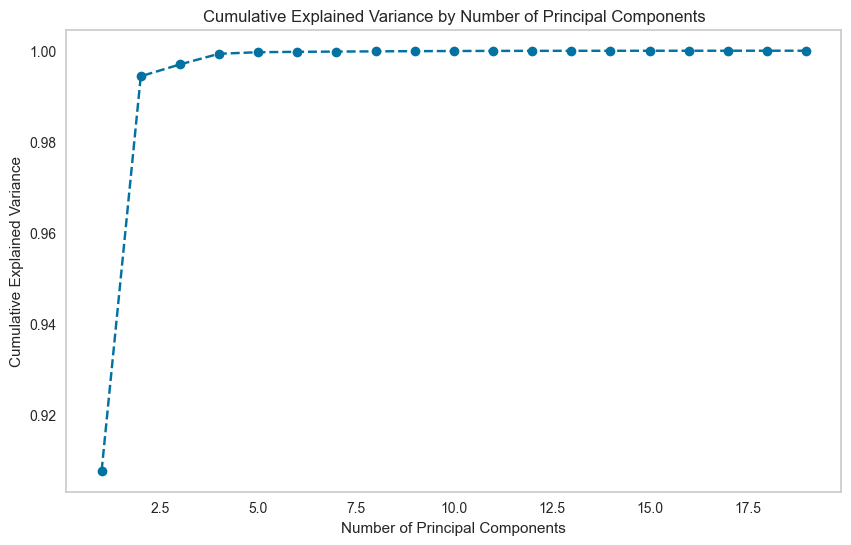

In [54]:
# Perform PCA
pca = PCA()
pca.fit(clustering_df_encoded)

# Compute cumulative variance
cumulative_variance = pca.explained_variance_ratio_.cumsum()

# Plot cumulative variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Principal Components')
plt.grid()
plt.show()

Based on the cumulative variance plot, we decided to keep 2 principal components based on the explained variance. Lets perform PCA with 2 components and extract the resulting component scores for the elements of our dataset.

In [56]:
from sklearn.decomposition import PCA # type: ignore

# Check the size of the dataset and sample if too large
sample_size = 10000  # Adjust sample size as needed
if clustering_df.shape[0] > sample_size:
    clustering_df = clustering_df.sample(n=sample_size, random_state=42)

# Perform PCA with 2 components
pca = PCA(n_components=2, random_state=42)
pca_result = pca.fit_transform(clustering_df)

# Create a DataFrame to store the PCA scores
pca_scores_df = pd.DataFrame(pca_result, columns=['pca_one', 'pca_two'])

# Print the PCA scores
print(pca_scores_df.head())


      pca_one    pca_two
0 -464.193835 -21.430929
1   48.843381   6.039611
2   48.843924   6.040587
3   48.846638   6.045463
4   48.843328   6.039392


The PCA scores illustrate how the high-dimensional demographic data has been effectively reduced to two principal components, highlighting clear separations and some overlaps among the clusters. When we combine PCA and K-means to segment our data, where we use the scores obtained by the PCA for the fit.

To determine the optimal number of clusters for K-Means algorithm, we run it with different number of clusters. Then, we determine the Within Cluster Sum of Squares (WCSS) for each solution.

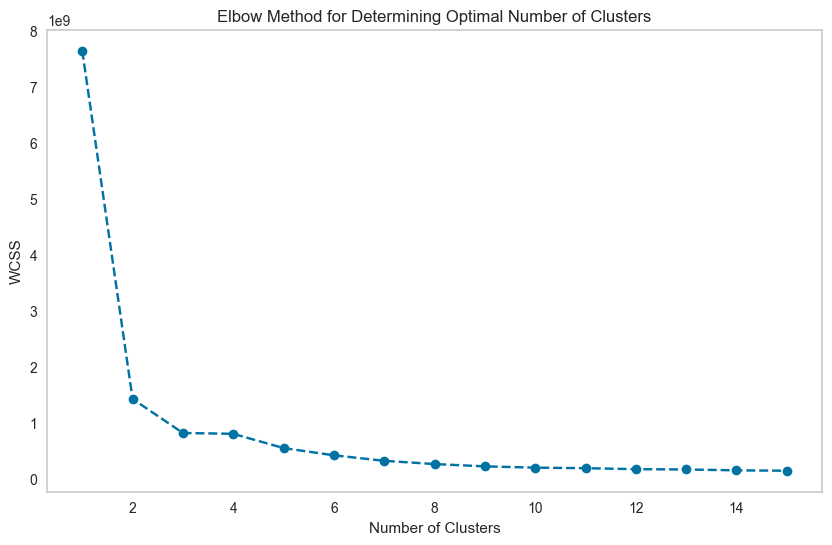

In [57]:
from sklearn.cluster import KMeans # type: ignore

# Determine the optimal number of clusters using the Elbow method
wcss = []
max_clusters = 15  # Set the maximum number of clusters to test

for i in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(clustering_df_encoded)
    wcss.append(kmeans.inertia_)

# Plot the WCSS against the number of clusters
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method for Determining Optimal Number of Clusters')
plt.grid()
plt.show()

 Based on the values of the WCSS and an approach known as the Elbow method, we made a decision to keep a two-cluster solution. 
 
 Let's visualize our clusters on a 2D plane. It's a 2D visualization, so we need to choose two components and use them as axes. The point of PCA was to determine the most important components. 

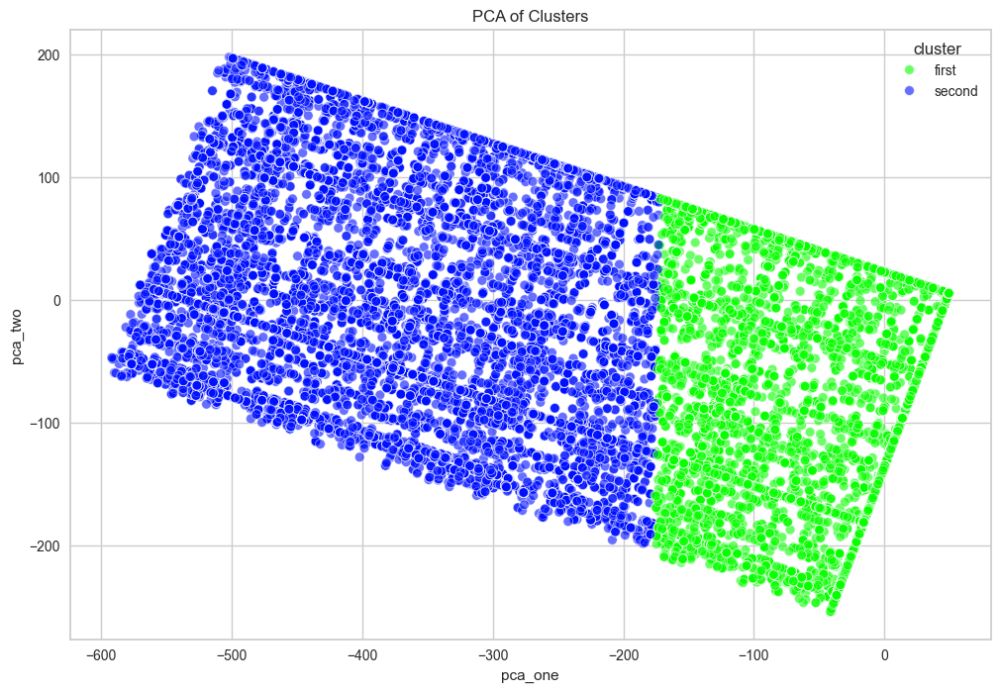

In [59]:
from sklearn.cluster import KMeans # type: ignore
from sklearn.decomposition import PCA # type: ignore
import seaborn as sns # type: ignore

# Create clustering_df using pivot_table
clustering_df = databank.pivot_table(index=['sess_id', 'cell_num_id'], columns='key_name', values='value_name', aggfunc='first').fillna('missing')

# Convert categorical features to numerical codes
clustering_df_encoded = clustering_df.apply(lambda x: x.astype('category').cat.codes if x.dtype == 'object' else x)

# Perform KMeans clustering
n_clusters = 2  # Set the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(clustering_df_encoded)

# Add cluster labels to clustering_df
clustering_df['cluster'] = cluster_labels
clustering_df['cluster'] = clustering_df['cluster'].map({0: 'first', 1: 'second'})

# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(clustering_df_encoded)

# Add PCA results to clustering_df
clustering_df['pca_one'] = pca_result[:, 0]
clustering_df['pca_two'] = pca_result[:, 1]

# Visualize clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='pca_one', y='pca_two',
    hue='cluster',
    palette=sns.color_palette('hsv', n_clusters),
    data=clustering_df,
    legend='full',
    alpha=0.6
)
plt.title('PCA of Clusters')
plt.show()

### **Key Observations:**

Our x-axis here is our 'pca_one'. The y-axis, on the other hand, is our 'pca_two'. When we employ PCA prior to using K-means we can separate the entire data set. That was one of the biggest goals of PCA - to reduce the number of variables by combining them into bigger, more meaningful features.

Cluster `first`:
- Could represent users who are younger, more tech-savvy, and frequently interact with market-related information.
- Customizing content for this group could focus on dynamic market updates and mobile-friendly interfaces.

Cluster `second`:
- Might represent older users with diverse needs, including legal, health, and anti-corruption information.
- Tailoring services for this group could involve simplified menus and easy access to relevant information.

### **t-Distributed Stochastic Neighbor Embedding (t-SNE)**

A non-linear dimensionality reduction algorithm for exploring high-dimensional data. It maps multi-dimensional data to two or more dimensions suitable for human observation.

C:\Users\jsjch\AppData\Local\Temp\ipykernel_20744\3281272405.py:18: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



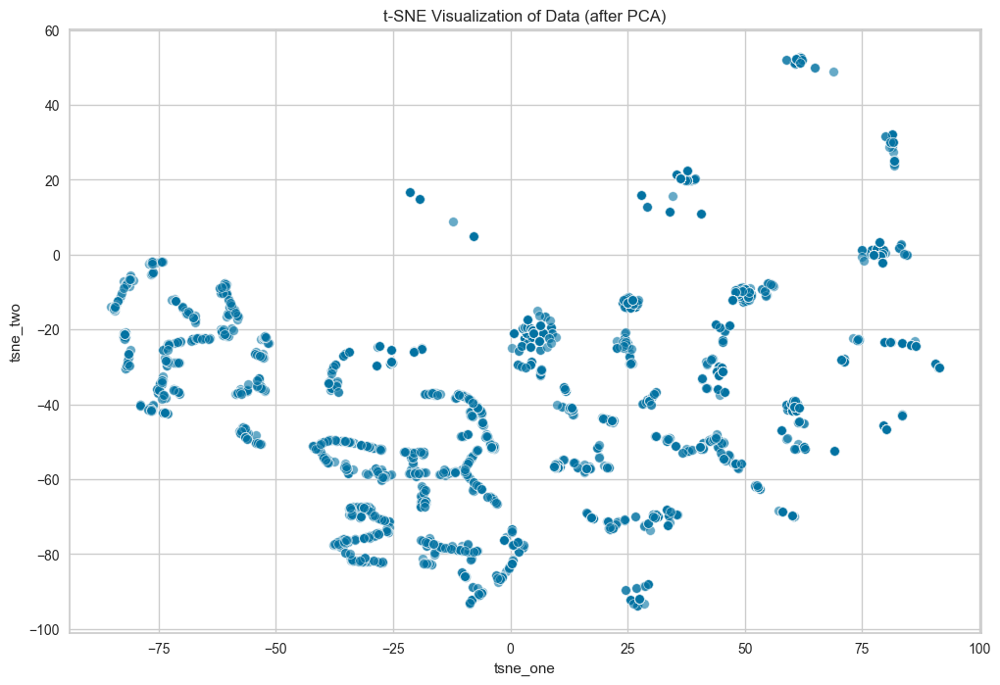

In [60]:
from sklearn.decomposition import PCA # type: ignore
from sklearn.manifold import TSNE # type: ignore
import seaborn as sns # type: ignore

# Use the existing pca_scores_df DataFrame
pca_result = pca_scores_df[['pca_one', 'pca_two']].values

# Use t-SNE on PCA-reduced data for further dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

# Add t-SNE results to pca_scores_df
pca_scores_df['tsne_one'] = tsne_result[:, 0]
pca_scores_df['tsne_two'] = tsne_result[:, 1]

# Visualize data using t-SNE components
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='tsne_one', y='tsne_two',
    palette=sns.color_palette('hsv', 10),  # Adjust the number of colors as needed
    data=pca_scores_df,
    legend=None,
    alpha=0.6
)
plt.title('t-SNE Visualization of Data (after PCA)')
plt.show()

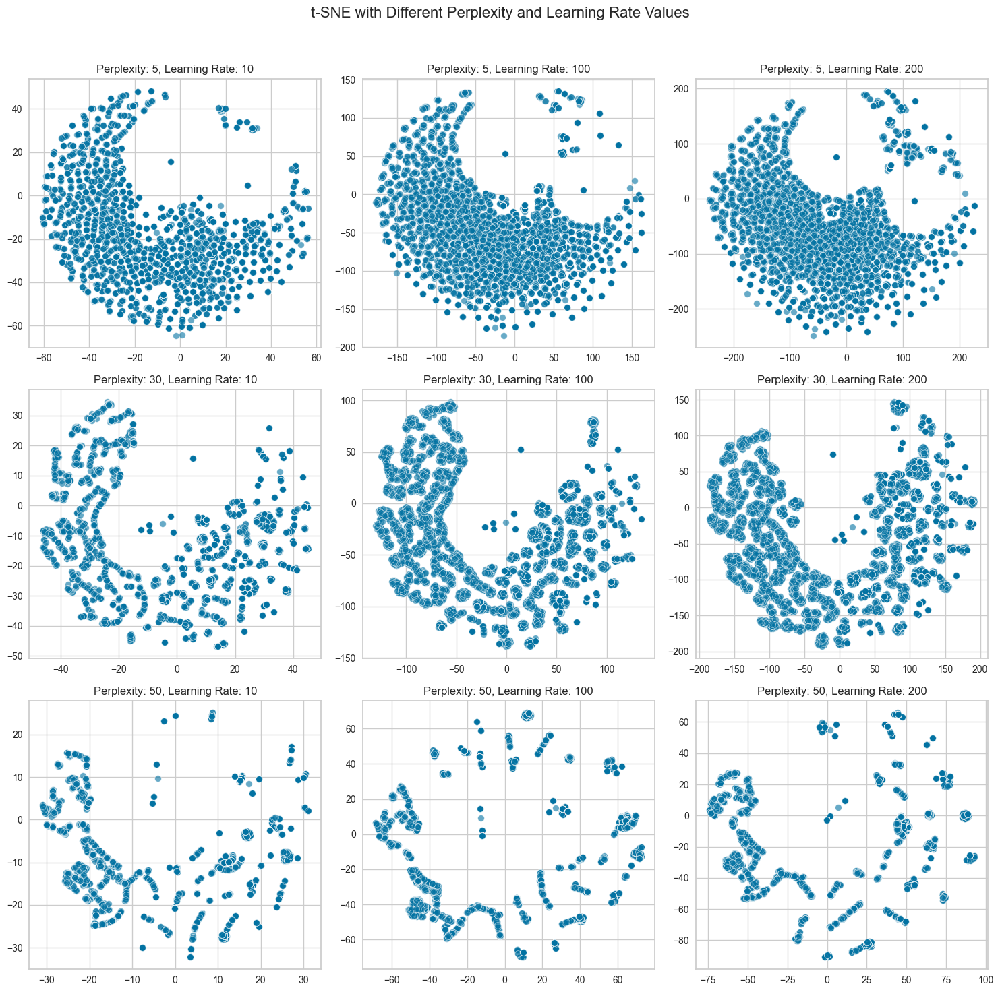

In [61]:
from sklearn.decomposition import PCA # type: ignore
from sklearn.manifold import TSNE # type: ignore
import seaborn as sns # type: ignore

# Define parameter grid for t-SNE
perplexities = [5, 30, 50]
learning_rates = [10, 100, 200]

# Create subplots for visualization
fig, axes = plt.subplots(len(perplexities), len(learning_rates), figsize=(15, 15))
fig.suptitle('t-SNE with Different Perplexity and Learning Rate Values', fontsize=16)

# Run t-SNE for each combination of perplexity and learning rate
for i, perplexity in enumerate(perplexities):
    for j, learning_rate in enumerate(learning_rates):
        tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=learning_rate, random_state=42)
        tsne_result = tsne.fit_transform(pca_scores_df)
        
        # Create a DataFrame for t-SNE results
        tsne_df = pd.DataFrame(tsne_result, columns=['tsne_one', 'tsne_two'])
        
        # Visualize data using t-SNE components
        ax = axes[i, j]
        sns.scatterplot(
            x='tsne_one', y='tsne_two',
            data=tsne_df,
            legend=None,
            alpha=0.6,
            ax=ax
        )
        ax.set_title(f'Perplexity: {perplexity}, Learning Rate: {learning_rate}')
        ax.set_xlabel('')
        ax.set_ylabel('')

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### **Key Observations**

**1. Cluster Separation:**
- At lower perplexity values (5), the clusters are more distinct and well-separated, especially at lower learning rates (10 and 100). However, at a higher learning rate (200), the clusters become more elongated and less distinct.
- At higher perplexity values (30 and 50), the clusters are less distinct and more scattered, especially at higher learning rates (100 and 200).

**2. Learning Rate Impact:**
- Lower learning rates (10) tend to produce more compact and well-defined clusters across all perplexity values.
- Higher learning rates (200) tend to produce more scattered and less distinct clusters, indicating that the learning rate might be too high for effective clustering.

**3. Perplexity Impact:**
- Lower perplexity values (5) seem to produce more meaningful and distinct clusters, especially at lower learning rates.
- Higher perplexity values (30 and 50) result in more scattered and less distinct clusters, suggesting that these values might be too high for the given data.

The overall structure and shape of the clusters vary significantly with different combinations of perplexity and learning rate, indicating that the choice of these parameters has a substantial impact on the t-SNE results.

## **Prerequisite Steps for t-SNE Clusters**

1. **Data Preparation:** Create a pivot table to organize data. Handle missing values by filling in gaps. 
2. **Identifying Categorical Features:** List all categorical features in the dataset.
3. **Converting to Categorical Data Type:** Convert identified features to 'category' type for encoding.
4. **Extracting Important Features:** Train a model (e.g., LightGBM) and calculate SHAP values. Select top important features based on SHAP values.
5. **Verifying Selected Features:** Ensure the selected features exist in the DataFrame.
6. **Using Selected Features for Clustering:** Perform KMeans clustering on selected features. Use PCA to reduce dimensionality. Apply t-SNE for visualization.

### **SHAP Visualization**

The **SHAP (SHapley Additive exPlanations)** plot visualizes on how pairs of features interact to influence the model's predictions. Each subplot represents the interaction of a specific feature with all other features, helping us understand the contribution of these interactions to the model's output.

#### **Key Features:**
- **age**
- **commoditymetacountry**
- **border**
- **commodityproduct**
- **crossingfreq**
- **commoditymetacat**
- **education**

#### **Plot Explanation**
- **The x-axis:** Represents the SHAP interaction value.
- **Each dot:** Represents an instance in the dataset. Colors indicate interaction effects:

  **1. Red dots** show **positive interaction** effects.
  
  **2. Blue dots** show **negative interaction** effects.

- **Spread and concentration of dots:** Provide insights into how feature interactions influence the model's predictions.

In [62]:
from sklearn.decomposition import PCA # type: ignore
from sklearn.manifold import TSNE # type: ignore
from sklearn.cluster import KMeans # type: ignore
import shap # type: ignore

# Print available columns
print("Available columns:", clustering_df.columns)

# Identify and convert categorical features to 'category' data type
categorical_features = clustering_df.select_dtypes(include=['object', 'category']).columns.tolist()
for col in categorical_features:
    clustering_df[col] = clustering_df[col].astype('category')

# Check the size of the dataset
print(f"Dataset shape: {clustering_df.shape}")

Available columns: Index(['age', 'border', 'commoditymarket', 'commoditymetacat',
       'commoditymetacountry', 'commodityproduct', 'crossingfreq', 'education',
       'exchangedirection', 'gender', 'language', 'occupation',
       'procedurecommodity', 'procedurecommoditycat', 'proceduredest',
       'procedureorigin', 'procedurerelevantagency',
       'procedurerequireddocument', 'produce', 'cluster', 'pca_one',
       'pca_two'],
      dtype='object', name='key_name')
Dataset shape: (369378, 22)


In [65]:
# Sample the entire dataset data to reduce computation time
# sample_size = 100000  # Adjust sample size as needed
# clustering_df_sampled = clustering_df.sample(n=sample_size, random_state=42) if clustering_df.shape[0] > sample_size else clustering_df

# Convert categorical features to numerical codes
# clustering_df_encoded = clustering_df_sampled.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

In [63]:
# Convert categorical features to numerical codes
clustering_df_encoded = clustering_df.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

# Perform KMeans clustering
n_clusters = 8
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(clustering_df_encoded)

# Train the LightGBM model using the same sampled dataset
lgb_km = lgb.LGBMClassifier(verbosity=-1)
lgb_km.fit(X=clustering_df_encoded, y=cluster_labels)

# Calculate SHAP values to identify important features
explainer = shap.TreeExplainer(lgb_km)
shap_values = explainer.shap_values(clustering_df_encoded)

# Extract feature importance from SHAP values
feature_importance = np.abs(shap_values).mean(axis=0)
important_features = np.argsort(feature_importance)[-10:]  # Select top 10 important features

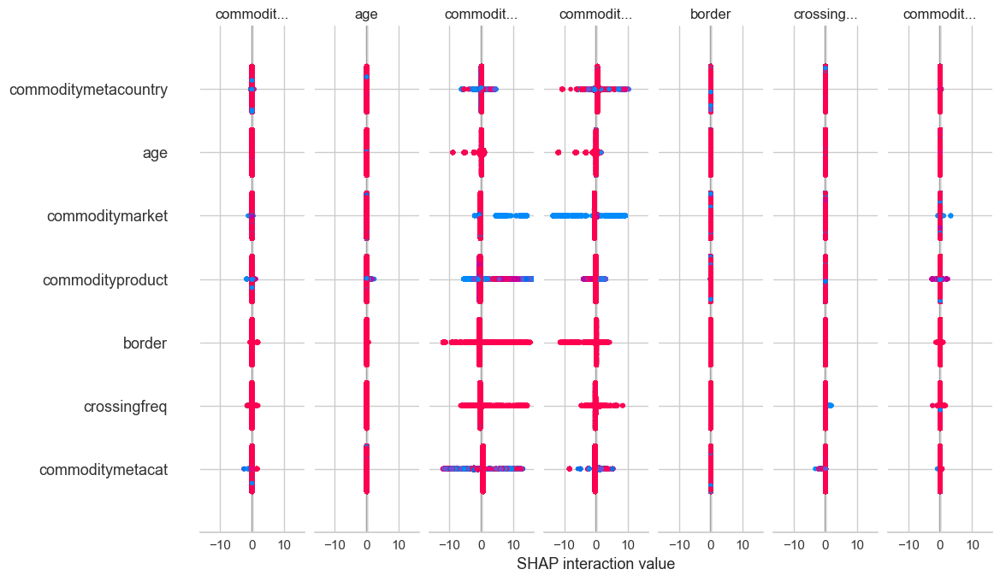

In [64]:
import shap # type: ignore

# Calculate SHAP values
explainer = shap.TreeExplainer(lgb_km)
shap_values = explainer.shap_values(clustering_df_encoded)

# Visualize SHAP values as a bar chart
shap.summary_plot(shap_values, clustering_df_encoded, plot_type="bar")

### **Transition to t-SNE of Clusters** 

**Positive (Red Dot) Interactions:** 
- **Age:** With **"education"** and **"crossingfreq"** – higher education levels and frequent crossings increase the model's predictions.
- **Commoditymetacountry:** With **"border"** and **"commoditymarket"** – certain commodity countries combined with these factors increase predictions.
- **Border:** With **"commodityproduct"** and **"commoditymetacountry"** – specific borders and commodities or countries increase predictions.
- **Commodityproduct:** With **"commoditymetacountry"** and **"commoditymarket"** – specific products combined with certain countries or markets increase predictions.
- **Crossingfreq:** With **"education"** and **"age"** – frequent crossings combined with higher education levels or certain age groups increase predictions.
- **Commoditymetacat:** With **"commoditymarket"** and **"commodityproduct"** – certain commodity categories combined with markets or products increase predictions.
- **Education:** With **"age"** and **"crossingfreq"** – higher education levels combined with certain age groups or frequent crossings increase predictions.

**Negative (Blue Dot) Interactions:**
- **Age:** With **"commodityproduct"** – specific age groups and certain commodities decrease the model's output.
- **Commoditymetacountry:** With **"procedurerelevantagency"** – certain combinations decrease predictions.
- **Border:** With **"crossingfreq"** – frequent crossings combined with certain borders decrease predictions.
- **Commodityproduct:** With **"age"** – certain products and age groups decrease predictions.
- **Crossingfreq:** With **"border"** – frequent crossings combined with certain borders decrease predictions.
- **Commoditymetacat:** With **"procedurerelevantagency"** – certain combinations decrease predictions.
- **Education:** With **"commodityproduct"** – certain education levels and specific commodities decrease predictions.

#### **Key Drivers: Age, Commoditymetacountry, Border, Commodityproduct**
These features show strong, consistent interactions with multiple other features, making them critical in the clustering algorithm.

#### **Supporting Features: Crossingfreq, Commoditymetacat, Education**
These features also play significant roles in cluster formation, especially when interacting with the key drivers.

### **Impact on t-SNE Clusters:**
By focusing on these influential features, the t-SNE clusters can accurately represent the complex relationships and interactions in the data. This ensures that the clusters formed in the t-SNE plot are meaningful and based on the most relevant dimensions, providing a clear and interpretable view of the data's structure.

In [68]:
# Convert to a NumPy array before indexing
selected_features = clustering_df_encoded.columns.to_numpy()[important_features].tolist()

# Flatten the selected_features list
selected_features = [item for sublist in selected_features for item in sublist]

# Print selected features to ensure they exist in the DataFrame
print("Selected features:", selected_features)

# Check if selected features exist in the DataFrame
missing_features = [feature for feature in selected_features if feature not in clustering_df_encoded.columns]
if missing_features:
    print("Missing features:", missing_features)
else:
    print("All selected features are present in the DataFrame.")

# Ensure selected features are correctly integrated
print("Checking integration of selected features:")
for feature in selected_features:
    if feature in clustering_df_encoded.columns:
        print(f"Feature '{feature}' is correctly integrated.")
    else:
        print(f"Feature '{feature}' is missing in the DataFrame.")

Selected features: ['commoditymetacat', 'commodityproduct', 'commoditymetacountry', 'border', 'age', 'commoditymarket', 'crossingfreq', 'education', 'commoditymarket', 'commoditymetacat', 'commodityproduct', 'commoditymetacountry', 'age', 'border', 'crossingfreq', 'education', 'age', 'commoditymarket', 'commoditymetacat', 'commoditymetacountry', 'commodityproduct', 'crossingfreq', 'border', 'education', 'border', 'commoditymarket', 'commoditymetacat', 'commoditymetacountry', 'commodityproduct', 'crossingfreq', 'education', 'age', 'age', 'border', 'commoditymetacat', 'commoditymetacountry', 'crossingfreq', 'commodityproduct', 'commoditymarket', 'education', 'age', 'border', 'commoditymarket', 'commoditymetacat', 'commoditymetacountry', 'crossingfreq', 'education', 'commodityproduct', 'age', 'border', 'commoditymarket', 'commoditymetacat', 'commoditymetacountry', 'commodityproduct', 'education', 'crossingfreq', 'border', 'commoditymetacat', 'commodityproduct', 'crossingfreq', 'commoditym

In [69]:
# Use only the selected important features for clustering
clustering_df_selected = clustering_df_encoded[selected_features]

# Perform KMeans clustering
n_clusters = 8  # Set the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(clustering_df_selected)

# Add cluster labels to clustering_df_sampled
clustering_df_sampled['cluster'] = cluster_labels # type: ignore # type: ignore

In [ ]:
# Perform PCA to reduce dimensionality
pca = PCA(n_components=10, random_state=42)  # Reduce n_components to speed up computation
pca_result = pca.fit_transform(clustering_df_selected)

# Use t-SNE on PCA-reduced data for further dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

In [ ]:
# Add t-SNE results to clustering_df_sampled
clustering_df_sampled['tsne_one'] = tsne_result[:, 0] # type: ignore
clustering_df_sampled['tsne_two'] = tsne_result[:, 1] # type: ignore

# Create interactive scatter plot using Plotly
fig = px.scatter(
    clustering_df_sampled, x='tsne_one', y='tsne_two', # type: ignore
    color='cluster', title='t-SNE of Clusters',
    labels={'tsne_one': 't-SNE One', 'tsne_two': 't-SNE Two'}
)
fig.show()

In [70]:
# Install the kaleido package
# %pip install -U kaleido

# Reload the package without restarting the kernel
# import importlib
# import kaleido
# importlib.reload(kaleido)

In [71]:
# %pip install psutil
# %pip install plotly-orca

In [70]:
import plotly.express as px # type: ignore

# Check the size of the dataset
print(f"Original dataset size: {clustering_df_sampled.shape}") # type: ignore

Original dataset size: (200000, 24)


In [71]:
# Sample the data to reduce the number of points plotted
plot_df_sampled = clustering_df_sampled.sample(frac=0.1, random_state=42)  # type: ignore # Adjust the fraction as needed
print(f"Sampled dataset size: {plot_df_sampled.shape}")

Sampled dataset size: (20000, 24)


In [72]:
import time
import threading
import plotly.express as px # type: ignore

# Function to handle the timeout
class TimeoutException(Exception):
    pass

def timeout_handler():
    raise TimeoutException("Code execution exceeded the time limit")

# Function to periodically print elapsed time
def print_elapsed_time(start_time):
    while not stop_thread:
        elapsed_time = time.time() - start_time
        print(f"Elapsed time: {elapsed_time:.2f} seconds", end='\r')
        time.sleep(1)

# Function to create and save the plot
def create_and_save_plot():
    print("Starting plot creation...")

    # Create interactive scatter plot using Plotly with adjusted axis ranges
    print("Creating scatter plot...")
    fig = px.scatter(
        clustering_df_sampled, x='tsne_one', y='tsne_two', # type: ignore
        color='cluster', title='t-SNE of Clusters',
        labels={'tsne_one': 't-SNE One', 'tsne_two': 't-SNE Two'}
    )
    print("Scatter plot created.")

    print("Updating layout...")
    fig.update_layout(
        xaxis_range=[-100, 100],
        yaxis_range=[-100, 100]
    )
    print("Layout updated.")

    # Save the graph as an HTML file
    # Specify the path where you want to save the file on your local machine
    file_path = "C:/Users/jsjch/OneDrive/Documents/github/sauti-market-segmentation-all/tsne_clusters_visualization.html"
    print(f"Saving plot to {file_path}...")
    fig.write_html(file_path)
    print("Plot saved.")

# Check the size of the dataset
print(f"Sampled dataset size: {clustering_df_sampled.shape}") # type: ignore

# Start timing
start_time = time.time()
stop_thread = False

# Start the thread to print elapsed time
thread = threading.Thread(target=print_elapsed_time, args=(start_time,))
thread.start()

# Set the timeout limit (in seconds)
timeout_limit = 3600  # Set your desired timeout limit here

# Start the timer thread
timer = threading.Timer(timeout_limit, timeout_handler)
timer.start()

try:
    create_and_save_plot()
    timer.cancel()  # Cancel the timer if the function completes in time

except TimeoutException as e:
    print(f"\n{e}")

finally:
    # End timing
    stop_thread = True
    end_time = time.time()

    # Wait for the thread to finish
    thread.join()

    # Print the final time taken
    print(f"\nTime taken to create and save the plot: {end_time - start_time} seconds")

Sampled dataset size: (200000, 24)
Starting plot creation...s
Creating scatter plot...
Scatter plot created.
Updating layout...
Layout updated.
Saving plot to C:/Users/jsjch/OneDrive/Documents/github/sauti-market-segmentation-all/tsne_clusters_visualization.html...
Plot saved.

Time taken to create and save the plot: 0.2848653793334961 seconds


## **Evaluating K-Means Clustering: Silhouette Score and Davies-Bouldin Index**
In the K-Means Clustering algorithm, it is important to evaluate the quality of the clusters formed. 

### **Silhouette Score**
The Silhouette Score is a measure of how similar an object is to its own cluster compared to other clusters. It ranges from -1 to 1, where a higher score indicates better-defined clusters.

Calculation:
Silhouette Coefficient (s): For each data point, the silhouette coefficient is calculated as follows:

`a`: The average distance between the data point and all other points in the same cluster.

`b`: The average distance between the data point and all points in the nearest neighboring cluster.

`s = (b - a) / max(a, b)`

A Silhouette Score close to 1 indicates that the data point is well-matched to its own cluster and poorly matched to neighboring clusters. A score close to 0 indicates that the data point is on or very close to the decision boundary between two neighboring clusters. A negative score indicates that the data point is likely misclassified.

### **Davies-Bouldin Index**
The Davies-Bouldin Index (DBI) is a measure of the average similarity ratio of each cluster with the cluster that is most similar to it. A lower DBI indicates better clustering performance.

Calculation:
Cluster Similarity `(R_i,j)`: For each cluster i, find the cluster j that maximizes the following ratio:

`R_i,j = (S_i + S_j) / D_i,j`

`S_i`: The average distance between each point in cluster i and the centroid of cluster i.

`D_i,j`: The distance between the centroids of clusters i and j.

DBI: The Davies-Bouldin Index is the average of the maximum similarity ratios for all clusters:

`DBI = (1/n) ∑ max(R_i,j)`

A lower DBI indicates that clusters are compact and well-separated from each other. The ideal DBI value is 0, which indicates perfect clustering.

In [147]:
from sklearn.metrics import silhouette_score, davies_bouldin_score # type: ignore

# Perform KMeans clustering
n_clusters = 8  # Set the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(clustering_df_encoded)

# Add cluster labels to clustering_df_sampled
clustering_df_sampled['cluster'] = cluster_labels # type: ignore

# Calculate silhouette score and Davies-Bouldin index
silhouette_avg = silhouette_score(clustering_df_encoded, cluster_labels)
db_index = davies_bouldin_score(clustering_df_encoded, cluster_labels)

print(f'Silhouette Score: {silhouette_avg}')
print(f'Davies-Bouldin Index: {db_index}')

Silhouette Score: 0.8885484828537822
Davies-Bouldin Index: 0.6881771936810798


### **Key Observations**
- **Silhouette Score:** Measures how well clusters are separated and cohesive. Higher values are better.
- **Davies-Bouldin Index:** Measures cluster similarity. Lower values are better.

### **Clusters with t-SNE and SHAP Important Features**

**Axes:**

**1. t-SNE One:** Represents the first dimension of the t-SNE projection.

**2. t-SNE Two:** Represents the second dimension of the t-SNE projection.


**Clusters:**

**Color-Coded Clusters:** The data points are colored according to their cluster assignments, with the color bar on the right indicating cluster labels ranging from 0 to 6. Each color corresponds to a different cluster.

- **Cluster 0 (Red):** Contains data points with higher **"age"** and frequent **"crossingfreq"**. This cluster primarily represents older individuals who frequently cross borders.
- **Cluster 1 (Blue):** Dominated by data points with high **"education"** and positive interactions with **"commoditymetacountry"**. Represents individuals with higher education levels and interactions with specific commodity countries.
- **Cluster 2 (Green):** Comprised of data points with significant **"commodityproduct"** and **"commoditymarket"** interactions. Indicates individuals involved in specific commodity markets and products.
- **Cluster 3 (Purple):** Includes data points with notable **"border"** and **"commoditymetacountry"** interactions. Represents cross-border transactions and interactions with specific commodity countries.
- **Cluster 4 (Orange):** Contains data points with strong negative interactions between **"crossingfreq"** and **"border"**. Represents individuals who cross borders frequently but are influenced negatively by certain border interactions.
- **Cluster 5 (Brown):** Features data points with **"age"** and **"education"** interactions. Indicates an age group combined with higher education levels impacting model predictions.
- **Cluster 6 (Pink):** Consists of data points with significant **"commoditymetacat"** and **"commoditymarket"** interactions. Represents interactions within specific commodity categories and markets.

**Separation and Grouping:** The clusters are visually distinct, with some overlap between them. This indicates how the data points are grouped and separated based on the selected features.

#### **Distinct Clusters:** 
The plot shows clear separation between some clusters, indicating that the t-SNE has effectively reduced the dimensionality while preserving the structure of the data.

For example, **cluster 0** and **cluster 1** are well-separated, showing distinct groupings of data points.

**Overlapping Clusters:**
- Some clusters have slight overlap, suggesting that there may be similarities in the data points at the boundaries of these clusters.
- This overlap could indicate potential areas for further refinement or investigation.

**Cluster Density:**
- The density of data points within each cluster varies, with some clusters being more densely packed than others.
- Densely packed clusters suggest strong internal cohesion, where data points within the cluster are more similar to each other.

**Importance of the t-SNE Visualization:**
- Understanding Data Structure: The t-SNE plot helps to understand the structure and distribution of high-dimensional data by reducing it to two dimensions.
- Identifying Patterns and Relationships: The visualization makes it easier to identify patterns and relationships between different clusters.

**Feature Selection Impact:** The selected features from the SHAP interaction plot influence the clustering, ensuring that the most relevant and impactful features are considered.

In [ ]:
clustering_df["cluster"] = clusters_predict

df_group = clustering_df.groupby('cluster').agg(
    {
        'age': lambda x: x.value_counts().index[0],
        'border': lambda x: x.value_counts().index[0],
        'occupation': lambda x: x.value_counts().index[0],
        'gender': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'crossingfreq': lambda x: x.value_counts().index[0],
        'produce': lambda x: x.value_counts().index[0],
        'commodityproduct': lambda x: x.value_counts().index[0],
        'commoditymarket': lambda x: x.value_counts().index[0],
        'language': lambda x: x.value_counts().index[0],
        'proceduredest': lambda x: x.value_counts().index[0],

    }
).sort_values("age").reset_index()
df_group

key_name,cluster,age,border,occupation,gender,education,crossingfreq,produce,commodityproduct,commoditymarket,language,proceduredest
0,2,21-30,missing,missing,missing,missing,missing,missing,missing,missing,English,missing
1,0,missing,missing,missing,missing,missing,missing,missing,missing,missing,English,missing
2,1,missing,missing,missing,missing,missing,missing,missing,missing,missing,English,missing
3,3,missing,missing,missing,missing,missing,missing,missing,missing,missing,English,missing
4,4,missing,missing,missing,missing,missing,missing,missing,missing,missing,Swahili,missing
5,5,missing,missing,missing,missing,missing,missing,missing,Dry Maize,missing,English,missing
6,6,missing,missing,missing,missing,missing,missing,missing,missing,missing,Somali,missing


## **Predictive Segmentation: Enhnacing Consumer Insights Using `LinearSVC` and `StandardScaler`**

To enhance our customer segmentation, we focuses on predicting the `response_theme` using input features from our cleaned **demographic and session data**. By analyzing new, unseen **user demographic** data, this model aims to provide deeper insights into consumer behavior and preferences.

Let's merge the interaction data of `requests` and `replies` while cleaning for columns when necessary

In [34]:
# Step 1: Merge the interaction data
interaction_data = pd.merge(requests, replies, on='request_id')
# Drop the unwanted columns
interaction_data.drop(['udate_y', 'sess_id_y'], axis=1, inplace=True)
# Rename the columns
interaction_data.rename(columns={'udate_x': 'udate', 'sess_id_x': 'sess_id'}, inplace=True)
interaction_data.head()

,request_id,request_text,udate,sess_id,reply_id,response_id
0,5122412,98,2023-09-14 14:42:35,476982,5096701,2213
1,5122413,00,2023-09-14 14:42:47,476982,5096703,2178
2,5122414,2,2023-09-14 14:42:49,476979,5096704,2656
3,5122415,5,2023-09-14 14:42:59,476982,5096705,2192
4,5122416,5,2023-09-14 14:43:12,476982,5096706,2243


In [35]:
interaction_data1 = pd.merge(interaction_data, screen_dict, on='response_id')
interaction_data1.head()

,request_id,request_text,udate,sess_id,reply_id,response_id,platform_id,response_theme,level,parent
0,5122413,00,2023-09-14 14:42:47,476982,5096703,2178,18,Main Screen,0,NaN
1,5122414,2,2023-09-14 14:42:49,476979,5096704,2656,2,Marketplace,1,298.0
2,5122414,2,2023-09-14 14:42:49,476979,5096704,2656,3,Marketplace,1,259.0
3,5122414,2,2023-09-14 14:42:49,476979,5096704,2656,5,Marketplace,1,482.0
4,5122414,2,2023-09-14 14:42:49,476979,5096704,2656,6,Marketplace,1,500.0


Let's merge the session data of `sessions` and `interaction_data1` while cleaning for columns when necessary

In [36]:
# Merge the session data
session_data = pd.merge(sessions, interaction_data1, on='sess_id')
# Drop the unwanted columns
session_data.drop(['platform_id_y'], axis=1, inplace=True)
# Rename the columns
session_data.rename(columns={'platform_id_x': 'platform_id'}, inplace=True)
session_data.head()

,sess_id,cell_num_id,created_date,udate_x,data,platform_id,notes,request_id,request_text,udate_y,reply_id,response_id,response_theme,level,parent
0,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4094,home,2017-06-06 14:19:26,1,1,Main Screen,0,NaN
1,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4095,1,2017-06-06 14:19:29,2,22,Trade Info,1,1.0
2,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4096,home,2017-06-06 14:19:34,3,1,Main Screen,0,NaN
3,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4097,2,2017-06-06 14:19:35,4,48,Trade Info,1,1.0
4,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN,4099,home,2017-06-06 21:52:29,6,1,Main Screen,0,NaN


Let's expand to the `databank` table

In [37]:
# Expanding the databank table
demographics = databank.pivot_table(index=['sess_id', 'cell_num_id'], columns='key_name', values='value_name', aggfunc='first')
demographics.head(10)

,key_name,age,border,commoditymarket,commoditymetacat,commoditymetacountry,commodityproduct,crossingfreq,education,exchangedirection,gender,language,occupation,procedurecommodity,procedurecommoditycat,proceduredest,procedureorigin,procedurerelevantagency,procedurerequireddocument,produce
sess_id,cell_num_id,,,,,,,,,,,,,,,,,,,
50.0,254000000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
52.0,254000000012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
54.0,254000000010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
59.0,254000000007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
61.0,254000000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
65.0,254000000002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
67.0,256000000035,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
68.0,254000000016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cereals,NaN,NaN,NaN,NaN,NaN
69.0,254000000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN


In [38]:
demographics_reset = demographics.reset_index()

In [39]:
demographics_reset.columns

Index(['sess_id', 'cell_num_id', 'age', 'border', 'commoditymarket',
       'commoditymetacat', 'commoditymetacountry', 'commodityproduct',
       'crossingfreq', 'education', 'exchangedirection', 'gender', 'language',
       'occupation', 'procedurecommodity', 'procedurecommoditycat',
       'proceduredest', 'procedureorigin', 'procedurerelevantagency',
       'procedurerequireddocument', 'produce'],
      dtype='object', name='key_name')

In [40]:
# Drop duplicates based on 'sess_id' and 'cell_num_id' only
demographics_unique = demographics_reset.drop_duplicates(subset='cell_num_id')
demographics_unique

key_name,sess_id,cell_num_id,age,border,commoditymarket,commoditymetacat,commoditymetacountry,commodityproduct,crossingfreq,education,...,gender,language,occupation,procedurecommodity,procedurecommoditycat,proceduredest,procedureorigin,procedurerelevantagency,procedurerequireddocument,produce
0,50.0,254000000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
1,52.0,254000000012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
2,54.0,254000000010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
3,59.0,254000000007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,UGA->KEN,EAC,NaN,NaN,NaN
4,61.0,254000000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369359,466900.0,254000119187,NaN,NaN,NaN,NaN,NaN,Dry Maize,NaN,NaN,...,NaN,Swahili,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369360,466901.0,254000119188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369364,466906.0,254000119190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
369367,466909.0,254000119191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Luganda,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
demographic_data = pd.merge(session_data, demographics_unique, on='cell_num_id')
demographic_data

,sess_id_x,cell_num_id,created_date,udate_x,data,platform_id,notes,request_id,request_text,udate_y,...,gender,language,occupation,procedurecommodity,procedurecommoditycat,proceduredest,procedureorigin,procedurerelevantagency,procedurerequireddocument,produce
0,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4094,home,2017-06-06 14:19:26,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
1,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4095,1,2017-06-06 14:19:29,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
2,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4096,home,2017-06-06 14:19:34,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
3,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4097,2,2017-06-06 14:19:35,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
4,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN,4099,home,2017-06-06 21:52:29,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2005568,478367,256000117411,2023-09-18 11:02:52,2023-09-18 08:04:38,"a:5:{s:16:""commoditycountry"";a:1:{i:0;s:3:""UGA...",2,NaN,5137708,1,2023-09-18 08:03:04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005569,478368,256000036160,2023-09-18 11:08:00,2023-09-18 08:08:54,"a:4:{s:8:""language"";a:1:{i:0;s:7:""English"";}s:...",2,NaN,5137717,1,2023-09-18 08:08:10,...,NaN,Samia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005570,478368,256000036160,2023-09-18 11:08:00,2023-09-18 08:08:54,"a:4:{s:8:""language"";a:1:{i:0;s:7:""English"";}s:...",2,NaN,5137719,3,2023-09-18 08:08:18,...,NaN,Samia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005571,478369,254000056114,2023-09-18 11:08:06,2023-09-18 08:09:11,"a:4:{s:8:""language"";a:1:{i:0;s:7:""English"";}s:...",18,NaN,5137720,1,2023-09-18 08:08:23,...,NaN,English,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
demographic_filtered = demographic_data[demographic_data['response_theme'] != 'Main Screen']
demographic_filtered

,sess_id_x,cell_num_id,created_date,udate_x,data,platform_id,notes,request_id,request_text,udate_y,...,gender,language,occupation,procedurecommodity,procedurecommoditycat,proceduredest,procedureorigin,procedurerelevantagency,procedurerequireddocument,produce
1,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4095,1,2017-06-06 14:19:29,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
3,1,254000000001,2017-06-19 22:40:35,2020-11-02 07:19:58,NaN,1,NaN,4097,2,2017-06-06 14:19:35,...,NaN,NaN,NaN,Millet,Cereals,UGA->KEN,Outside the EAC,NaN,NaN,NaN
5,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN,4100,2,2017-06-06 21:52:32,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
7,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN,4103,2,2017-06-06 21:53:09,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
9,2,254000000002,2017-06-19 23:36:12,2020-11-02 07:19:58,NaN,1,NaN,4106,2,2017-06-06 21:53:35,...,NaN,NaN,NaN,Maize,Cereals,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2005566,478367,256000117411,2023-09-18 11:02:52,2023-09-18 08:04:38,"a:5:{s:16:""commoditycountry"";a:1:{i:0;s:3:""UGA...",2,NaN,5137708,1,2023-09-18 08:03:04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005567,478367,256000117411,2023-09-18 11:02:52,2023-09-18 08:04:38,"a:5:{s:16:""commoditycountry"";a:1:{i:0;s:3:""UGA...",2,NaN,5137708,1,2023-09-18 08:03:04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005568,478367,256000117411,2023-09-18 11:02:52,2023-09-18 08:04:38,"a:5:{s:16:""commoditycountry"";a:1:{i:0;s:3:""UGA...",2,NaN,5137708,1,2023-09-18 08:03:04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005570,478368,256000036160,2023-09-18 11:08:00,2023-09-18 08:08:54,"a:4:{s:8:""language"";a:1:{i:0;s:7:""English"";}s:...",2,NaN,5137719,3,2023-09-18 08:08:18,...,NaN,Samia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
# Drop the unwanted columns
demographic_filtered.drop(['udate_y', 'sess_id_y'], axis=1, inplace=True)
# Rename the columns
demographic_filtered.rename(columns={'udate_x': 'udate', 'sess_id_x': 'sess_id'}, inplace=True)

C:\Users\jsjch\AppData\Local\Temp\ipykernel_19816\1260896011.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demographic_filtered.drop(['udate_y', 'sess_id_y'], axis=1, inplace=True)
C:\Users\jsjch\AppData\Local\Temp\ipykernel_19816\1260896011.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demographic_filtered.rename(columns={'udate_x': 'udate', 'sess_id_x': 'sess_id'}, inplace=True)


Let's define our feature DataFrame (e.g., `border`, `commoditymarket`, `commoditymetacat`, etc.) and target variable `response_theme`

In [81]:
# Sample a smaller subset of the data to reduce computation time
sample_size = 1000000 # Adjust sample size as needed
demographic_data_sampled = demographic_data.sample(n=sample_size, random_state=42) if demographic_data.shape[0] > sample_size else demographic_data

In [82]:
# Define your feature DataFrame and target variable
X = demographic_data_sampled.drop(['response_theme', 'reply_id', 'request_id', 'response_id', 'parent', 'created_date', 'notes'], axis=1)
y = demographic_data_sampled['response_theme']

In [83]:
X.columns

Index(['sess_id_x', 'cell_num_id', 'udate_x', 'data', 'platform_id',
       'request_text', 'udate_y', 'level', 'sess_id_y', 'age', 'border',
       'commoditymarket', 'commoditymetacat', 'commoditymetacountry',
       'commodityproduct', 'crossingfreq', 'education', 'exchangedirection',
       'gender', 'language', 'occupation', 'procedurecommodity',
       'procedurecommoditycat', 'proceduredest', 'procedureorigin',
       'procedurerelevantagency', 'procedurerequireddocument', 'produce'],
      dtype='object')

### **Customer Segmentation: Classification Model Evaluation**

1. **`Demographic` and `Session` Data Preparation and Cleaning**
2. **Feature Engineering and Transformation**
3. **Combine Preprocessing Steps**
4. **Model Training**
5. **Model Evaluation and Classification Report**

In [84]:
from sklearn.model_selection import train_test_split  # type: ignore # Import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [85]:
# Define categorical and numerical colmns
categorical_columns = X.select_dtypes(include=['object']).columns
numerical_columns = X.select_dtypes(include=['int64', 'float64']).columns

In [86]:
from datetime import datetime
X['udate_x'] = X['udate_x'].apply(lambda d:datetime.strptime(d, '%Y-%m-%d %H:%M:%S'))
X['udate_y'] = X['udate_y'].apply(lambda d:datetime.strptime(d, '%Y-%m-%d %H:%M:%S'))

Let's create the preprocessing pipelines for both numerical and categorical data using `StandardScaler` and `OneHotEncoder` respectively

In [87]:
from sklearn.impute import SimpleImputer # type: ignore
from sklearn.preprocessing import StandardScaler # type: ignore
from sklearn.pipeline import Pipeline # type: ignore

# Create the preprocessing pipelines for both numerical and categorical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())  # Corrected from 'scalar' to 'scaler'
])

from sklearn.preprocessing import OneHotEncoder # type: ignore
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

Let's combine preprocessing of numerical and categorical data with the preprocessor `ColumnTransformer`

In [88]:
from sklearn.compose import ColumnTransformer # type: ignore

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ])

Let's build the `LinearSVC` model using the `preprocessor`  

In [89]:
from sklearn.svm import LinearSVC # type: ignore

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LinearSVC(random_state=42))
])

In [90]:
# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['sess_id_x', 'cell_num_id', 'platform_id', 'level', 'sess_id_y'], dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   On...
       'commoditymarket', 'commoditymetacat', 'commoditymetacountry',
       'commodityproduct', 'crossingfreq', 'education', 'exchangedirection',
       'gender', 'language', 'occupation', 'procedurecommodity',
       'procedurecommoditycat', 'proceduredest', 'procedureorigin',
       'procedurerelevantagency', 'procedurerequireddocument', 'produce'],
      dtype='object'))])),
                ('classifier', LinearSVC(random_state=42))])

In [91]:
# Predict on the test data
y_pred = pipeline.predict(X_test)

Let's evaluate the performance of the `LinearSVC` model by creating a classification report and printing the accuracy score

In [92]:
from sklearn.metrics import classification_report, accuracy_score # type: ignore

# Evaluate the model
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

Classification Report:
                                 precision    recall  f1-score   support

                   Agriculture       0.79      0.64      0.71      5369
                    COVID Info       0.88      0.93      0.90     13953
                Crop Nutrition       0.66      0.15      0.25       473
          Crop/Poultry Farming       0.75      0.23      0.36      1470
                Exchange Rates       0.83      0.76      0.79     15530
          Financial Management       0.76      0.79      0.77      9602
   Good Agricultural Practices       0.57      0.10      0.17      1153
                   Health Info       0.87      0.52      0.65      1964
             Health/Legal Info       0.76      0.92      0.84      3407
      Kenya Business Operation       0.73      0.66      0.69      2189
Kenya Business Operations Info       0.45      0.33      0.38        27
 Legal and Anticorruption Info       0.70      0.57      0.63       759
                   Main Screen       1.

#### **High-Performing Classes: COVID Info, Exchange Rates, Financial Management, Main Screen, Market Prices, Marketplace, Weather**
- **Metrics:** High precision, recall, and F1-scores
- **Insight:** The model effectively classifies instances on these topics, showing strong performance.

#### **Low-Performing Classes: Crop Nutrition, Crop/Poultry Farming, Good Agricultural Practices, Kenya Business Operations Info**
- **Metrics:** Lower precision, recall, and F1-scores
- **Insight:** The model struggles with these topics, indicating a need for further tuning or additional data preprocessing.

#### **Aggregated Performance Metrics**
- **Weighted Average:** Considers class imbalance and assigns more weight to classes with more instances, resulting in higher values.
- **Macro Average:** Calculates the average without considering class imbalance, providing an overall performance measure.

The `LinearSVC` model has achieved an overall accuracy of over 90% on the subset `demographic` and `session` dataset. However, performance varies across different classes. To address these discrepancies, further tuning or additional data preprocessing may be needed, depending on the importance of each class.

The `LinearSVC` model enables us to create more precise and meaningful segments, leading to targeted marketing strategies and improved consumer engagement. Predicting the `response_theme` based on input features from the cleaned `demographic` and `session` dataframe helps us train our model with new, unseen user demographic data.

--- 

Despite the overall strong performance of the `LinearSVC` model, it exhibits variability across different classes. While it excels in classifying certain topics, it struggles with others, highlighting the need for ongoing refinement and data enhancements. By continuously improving our model, we can ensure more accurate and actionable consumer segmentation, ultimately enhancing our marketing strategies and engagement efforts. 🚀

If you have any further questions or need more details, feel free to ask! 🚀